Smartmeter Data Science Challenge
=================================

This challenge is designed to test basic electrical engineering skills together
with data science techniques.

It involves a slimmed-down problem of non-intrusive load monitoring (NILM) for
smartmeter data measured in our office.

The data
--------

The data is a table of smartmeter measurements over 0.2 sec time intervals.  The
measured quantities (from a single AC phase) are:

  * `I_rms`: RMS current (in A)

  * `U_rms`: RMS voltage (in V)

  * `S`: apparent power (in VA)

  * `Q`: reactive power (in VA)

  * `P`: active power (in W)

  * `harmonic_I_NN`: the `NN`th harmonic of current, for 3rd, 5th and 7th
    harmonics of the AC frequency

The AC frequency of this data is 50 Hz, and the rating voltage is 230 V.

The challenge
-------------

Based on the provided data, answer the following questions:

  * Identify when in the time series devices are being turned on and
    off

  * How many distinct devices can be observed?  Can you map individual
    on/off events to the device?

      - you do not need to identify the _actual_ device, but rather
        to classify the events based on features in the dataset

  * Based on the different feature values associated with different
    devices, can you say anything about the kinds of device they are?
    (Give clear reasons for your answers.)

We recommend (but do not strictly require) that you implement your solution as
a Jupyter Notebook using Python, as this is the language our team uses most in
production.

Some requirements:

  * Try to write clean and clear code that a colleague would find a
    pleasure to maintain and modify (use code documentation as you
    see fit to aid in this)

  * Please document your work and ideas in a way that helps us clearly
    understand the reasons for your approach and the thinking behind
    any insights you obtain

Feel free to ask us whatever questions you like, just as if you were a colleague
working remotely.

In [2]:
import pandas as pd
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
from datetime import datetime
import numpy as np
import ruptures as rpt
from scipy import signal
%matplotlib inline

In [3]:
matplotlib.rcParams['figure.figsize'] = [20, 10]

In [4]:
path = '/home/itai/Downloads/meter_data.csv'

In [5]:
df = pd.read_csv(path)

In [6]:
df.dtypes

timestamp         object
I_rms            float64
U_rms            float64
S                float64
Q                float64
P                float64
harmonic_I_03    float64
harmonic_I_05    float64
harmonic_I_07    float64
dtype: object

In [7]:
df['timestamp'] = df['timestamp'].apply(lambda x: np.timedelta64(pd.Timestamp(x) -pd.Timestamp(df['timestamp'].iloc[0]),'ms').astype(np.int32))
#df  = df.set_index('timestamp')

In [8]:
df.head(5)

,timestamp,I_rms,U_rms,S,Q,P,harmonic_I_03,harmonic_I_05,harmonic_I_07
0,0,0.026616,238.914564,6.358997,4.107624,-1.103088,1.693918,2.364160,2.239170
1,189,0.022169,238.994721,5.298291,3.421000,-0.804425,2.711630,2.855956,1.912822
2,392,0.020819,239.176934,4.979447,3.722391,-0.704212,0.687889,3.624636,2.490151
3,595,0.026826,239.269831,6.418585,4.067994,-1.271494,4.530055,1.087715,3.392836
4,798,0.031124,239.261189,7.446851,3.810160,-1.343031,0.065944,2.000889,2.086636


In [9]:
df.tail(5)

,timestamp,I_rms,U_rms,S,Q,P,harmonic_I_03,harmonic_I_05,harmonic_I_07
9645,8382072,0.170232,236.780165,40.307558,3.855475,-1.749976,3.337991,5.010886,1.250956
9646,8382261,0.173348,236.808769,41.050440,3.568219,-1.480689,0.675882,5.329158,3.578383
9647,8382472,0.158800,236.919575,37.622733,4.083456,-1.179706,3.487976,5.090195,2.085005
9648,8382661,0.165998,237.034279,39.347210,3.960099,-1.486027,3.928940,4.666955,3.509041
9649,8382864,0.165162,237.209797,39.178052,4.239156,-1.663138,3.253428,6.072912,1.836846


In [10]:
df.describe()

,timestamp,I_rms,U_rms,S,Q,P,harmonic_I_03,harmonic_I_05,harmonic_I_07
count,9.650000e+03,9650.000000,9650.000000,9650.000000,9650.000000,9650.000000,9650.000000,9650.000000,9650.000000
mean,4.802953e+06,11.363834,232.232427,2615.488043,321.481228,2571.637872,1040.063167,528.156738,336.968389
std,2.473819e+06,6.660888,6.514105,1513.444025,252.290970,1528.008685,887.741635,388.749215,205.276634
min,0.000000e+00,0.015192,77.941108,3.611295,2.056576,-2.811189,0.065944,0.067635,0.068902
25%,2.347657e+06,5.589121,229.257473,1317.505642,71.257311,1176.604549,115.190838,138.671775,195.915933
50%,5.200226e+06,12.520125,232.064177,2909.613971,461.861175,2862.857743,1655.020919,840.935039,358.067002
75%,6.930100e+06,16.887761,235.539302,3898.409682,525.603854,3877.311505,1859.585177,888.767090,512.998248
max,8.382864e+06,21.735564,241.107871,4972.415234,1071.879407,4942.606912,2455.626446,1291.685385,878.731304


# Plotting all quantities. 

<AxesSubplot:>

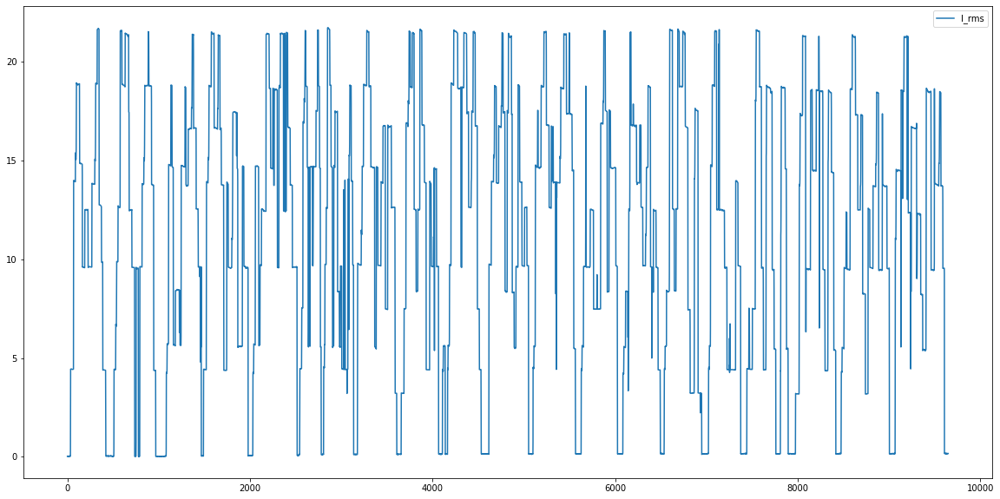

In [11]:
df[['I_rms']].plot()

<AxesSubplot:title={'center':'RMS current [A], RMS voltage [V]'}>

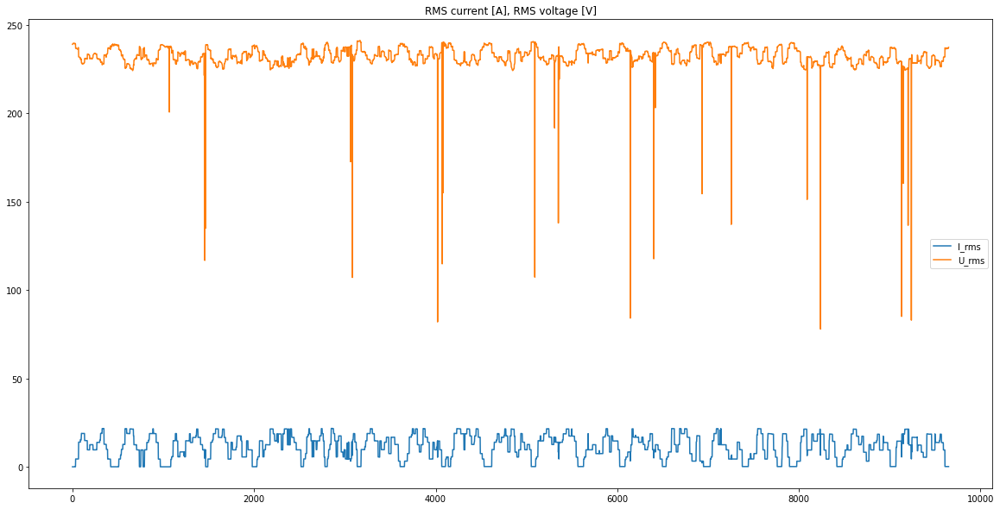

In [15]:
df[['I_rms','U_rms']].plot(title = 'RMS current [A], RMS voltage [V]')

<AxesSubplot:title={'center':'apparent power S'}, ylabel='[VA]'>

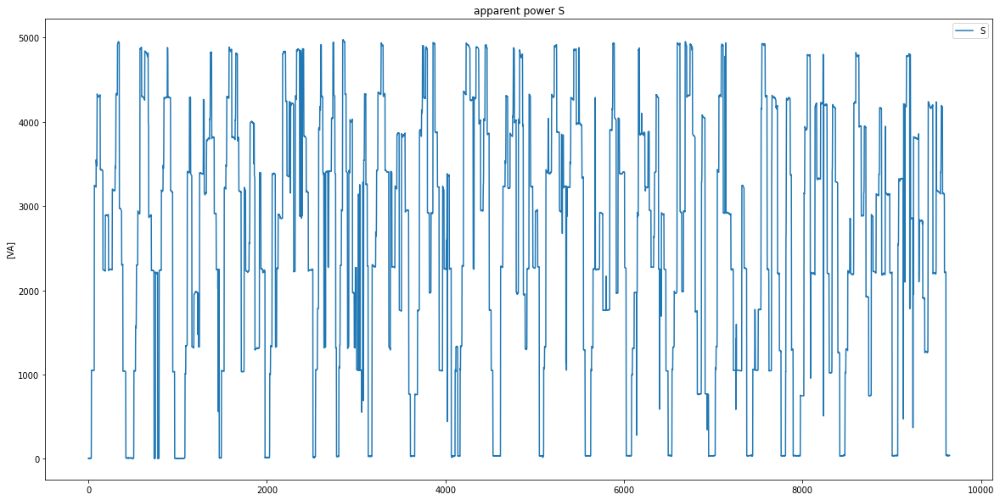

In [16]:
df[['S']].plot(title = 'apparent power S',ylabel='[VA]')

<AxesSubplot:title={'center':'active power P'}, ylabel='[Watt]'>

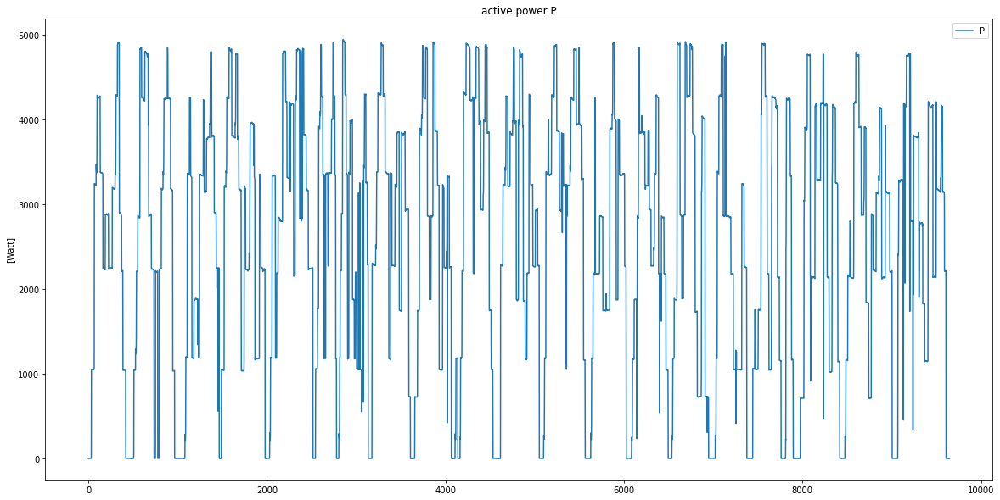

In [17]:
df[['P']].plot(title = 'active power P',ylabel='[Watt]' )

<AxesSubplot:title={'center':'reactive power Q'}, ylabel='[VA]'>

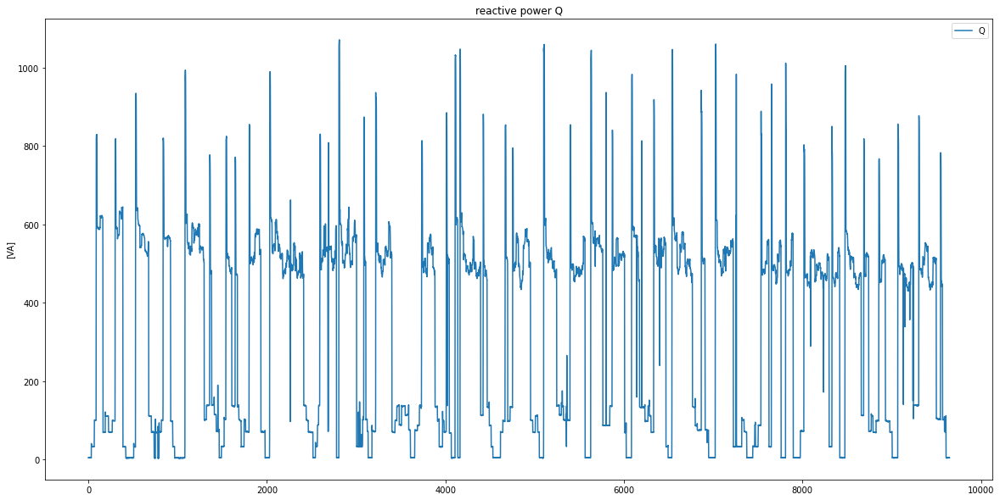

In [18]:
df[['Q']].plot(title = 'reactive power Q',ylabel='[VA]')

<AxesSubplot:title={'center':'harmonic_I_NN'}>

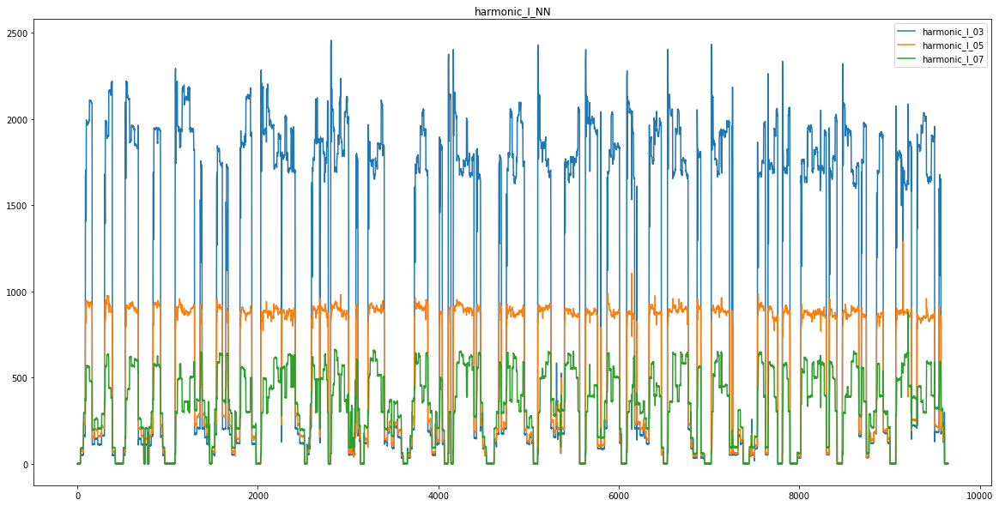

In [19]:
df[['harmonic_I_03','harmonic_I_05','harmonic_I_07']].plot(title = 'harmonic_I_NN')

# additional plot for the integral 

In [20]:
df_new = df[df.columns.drop('timestamp')]

In [21]:
df_sum = df_new.cumsum()

<AxesSubplot:>

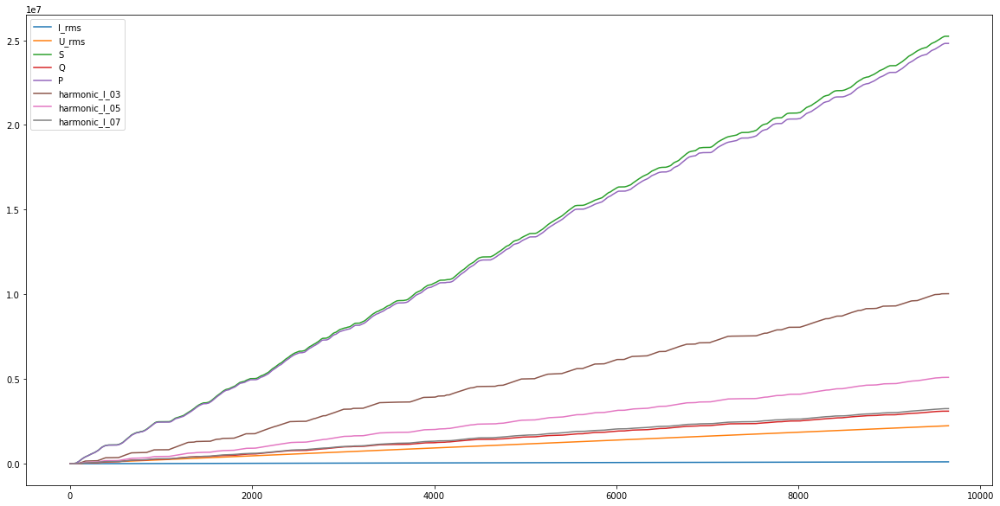

In [22]:
df_sum.plot()

## Assumption I. When P (active power) switches +/-, a device is turned on/off. 

In [23]:
P_np = np.array(df['P'])
res_filter =[x for x in range(0,9620) if (P_np[x-1]<0 and P_np[x]>10) or (P_np[x]>10 and P_np[x+1]<0)]

We'll create time segments according to this filter above:

In [24]:
tup_list = [(res_filter[i],res_filter[i+1]) for i in range(0,len(res_filter),2)]

* Compute the approx. time length for each interval in [secs].

* There are <code> len(tup_list) </code> segments where some device/s is/are working.

In [25]:
print('Segment, Length [sec]\n')
for i,j in zip(range(len(tup_list)),[(x[1]-x[0])*0.2 for x in tup_list]):
    print(i,j)

Segment, Length [sec]

0 77.0
1 45.400000000000006
2 5.0
3 34.6
4 76.80000000000001
5 97.60000000000001
6 97.0
7 47.0
8 65.60000000000001
9 86.0
10 81.80000000000001
11 6.0
12 73.4
13 86.80000000000001
14 92.80000000000001
15 79.2
16 81.80000000000001
17 82.2
18 70.4
19 63.400000000000006
20 16.8
21 88.2
22 105.60000000000001
23 107.80000000000001


##  Plot all segments for  I_rms.

<Figure size 2560x1920 with 0 Axes>

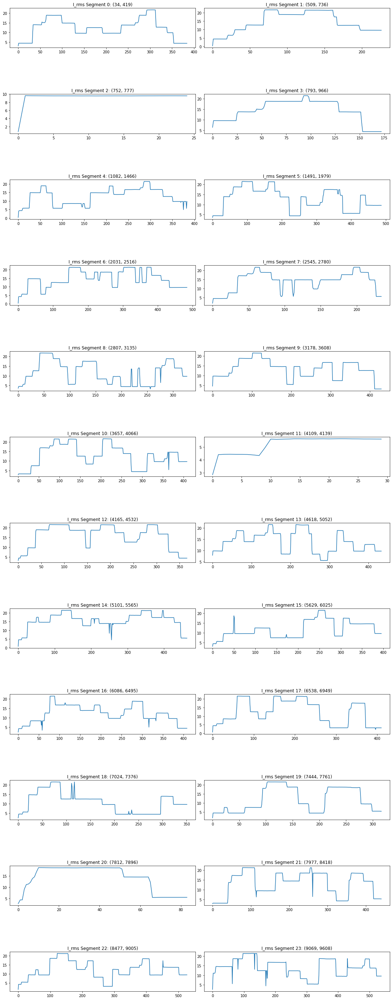

In [26]:
points = np.array(df['I_rms'])
figure(figsize=(16, 12), dpi=160)
fig, axs = plt.subplots(len(tup_list)//2, 2)
fig.tight_layout()

fig.set_figheight(40)
fig.set_figwidth(15)
for i in range(0,len(tup_list),2):
    tup_0 = tup_list[i]
    tup_1 = tup_list[i+1]
    axs[i//2 , 0].plot(points[tup_0[0]:tup_0[1]])
    axs[i//2 , 0].set_title('I_rms Segment {0}: {1}'.format(i,tup_0))
    axs[i//2 , 1].plot(points[tup_1[0]:tup_1[1]])
    axs[i//2 , 1].set_title('I_rms Segment {0}: {1}'.format(i+1,tup_1))
    

##  Plot all of these segments for  P; compute integral.

<Figure size 2560x1920 with 0 Axes>

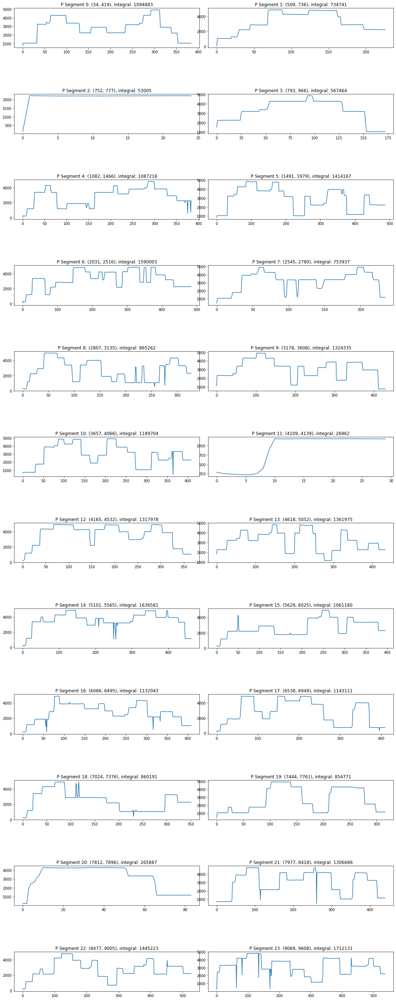

In [27]:
points = np.array(df['P'])
figure(figsize=(16, 12), dpi=160)
fig, axs = plt.subplots(len(tup_list)//2, 2)
fig.tight_layout()

fig.set_figheight(40)
fig.set_figwidth(15)
for i in range(0,len(tup_list),2):
    tup_0 = tup_list[i]
    tup_1 = tup_list[i+1]
    integral_0 = int(np.cumsum(points[tup_0[0]:tup_0[1]])[-1])
    integral_1 = int(np.cumsum(points[tup_1[0]:tup_1[1]])[-1])
    axs[i//2 , 0].plot(points[tup_0[0]:tup_0[1]])
    axs[i//2 , 0].set_title('P Segment {0}: {1}, integral: {2}'.format(i,tup_0,integral_0))
    axs[i//2 , 1].plot(points[tup_1[0]:tup_1[1]])
    axs[i//2 , 1].set_title('P Segment {0}: {1}, integral: {2}'.format(i+1,tup_1,integral_1))

##  Plot all of these segments for  harmonic_I_03

<Figure size 2560x1920 with 0 Axes>

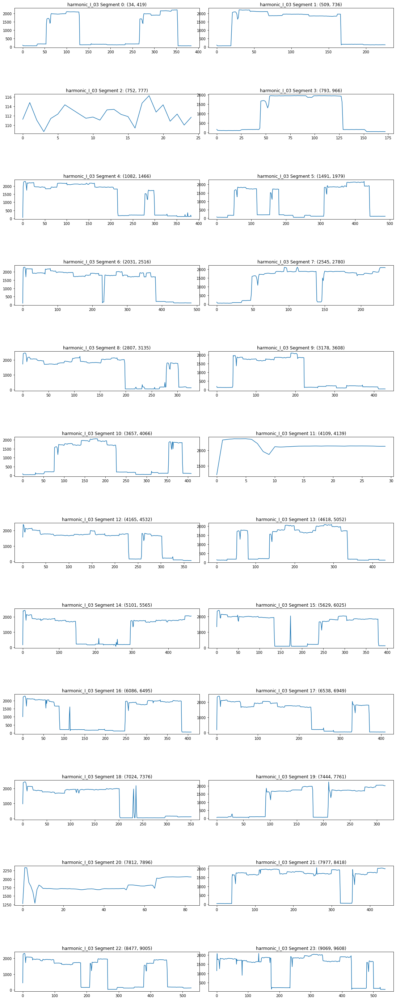

In [28]:
points = np.array(df['harmonic_I_03'])
figure(figsize=(16, 12), dpi=160)
fig, axs = plt.subplots(len(tup_list)//2, 2)
fig.tight_layout()

fig.set_figheight(40)
fig.set_figwidth(15)
for i in range(0,len(tup_list),2):
    tup_0 = tup_list[i]
    tup_1 = tup_list[i+1]
    axs[i//2 , 0].plot(points[tup_0[0]:tup_0[1]])
    axs[i//2 , 0].set_title('harmonic_I_03 Segment {0}: {1}'.format(i,tup_0))
    axs[i//2 , 1].plot(points[tup_1[0]:tup_1[1]])
    axs[i//2 , 1].set_title('harmonic_I_03 Segment {0}: {1}'.format(i+1,tup_1))
    

# plot all graphs for all segments.

/home/itai/.pyenv/versions/3.7.6/envs/freq/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<Figure size 2560x1920 with 0 Axes>

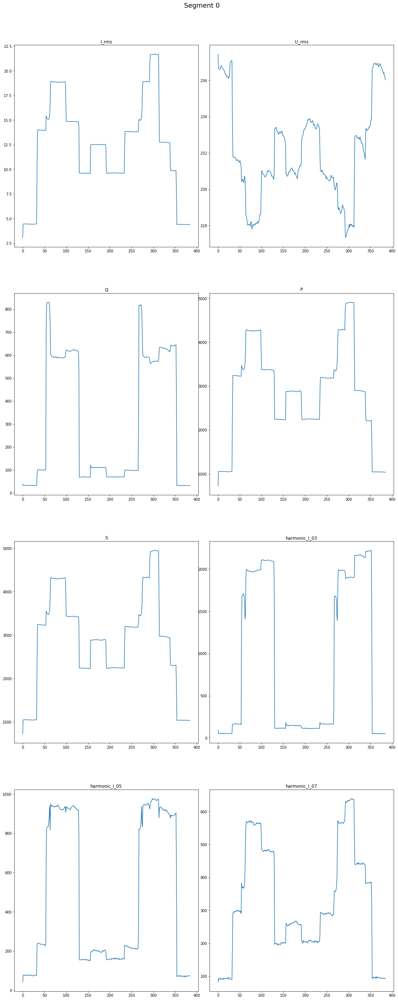

<Figure size 2560x1920 with 0 Axes>

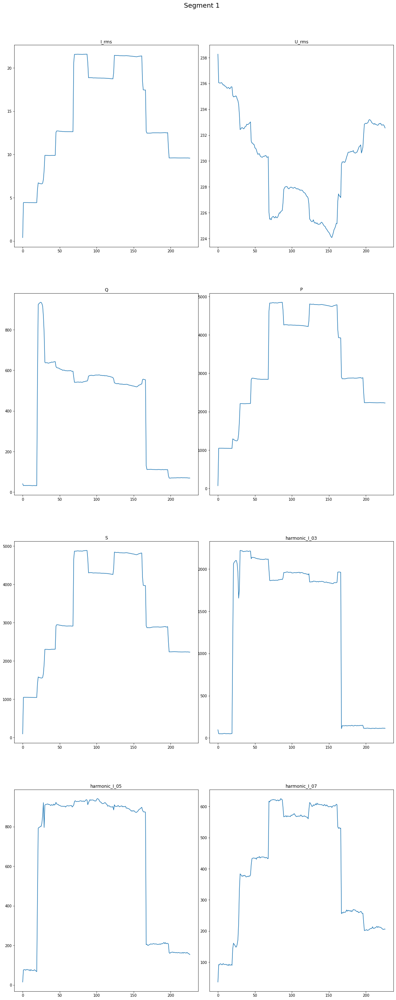

<Figure size 2560x1920 with 0 Axes>

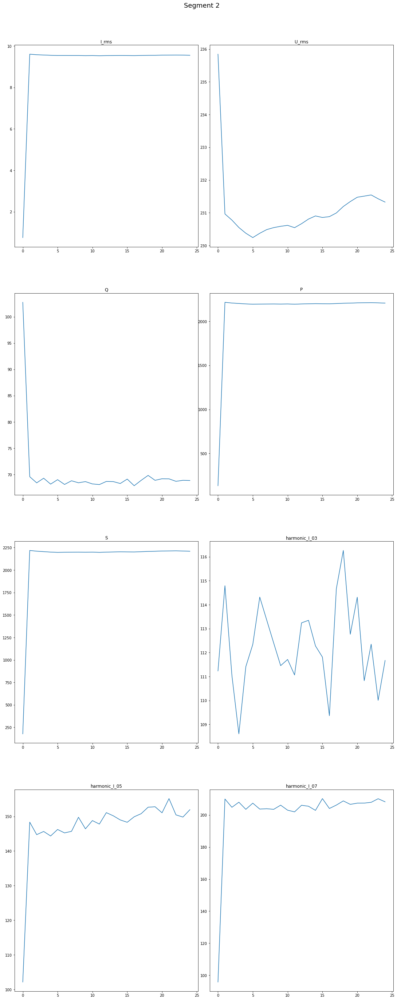

<Figure size 2560x1920 with 0 Axes>

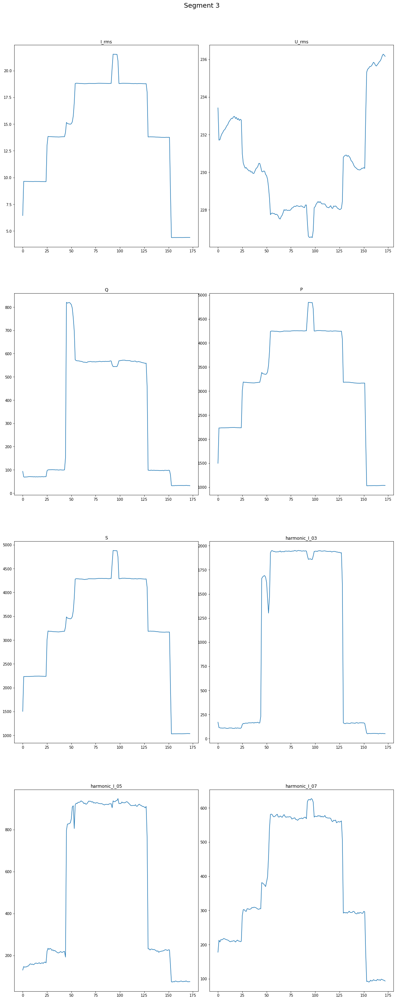

<Figure size 2560x1920 with 0 Axes>

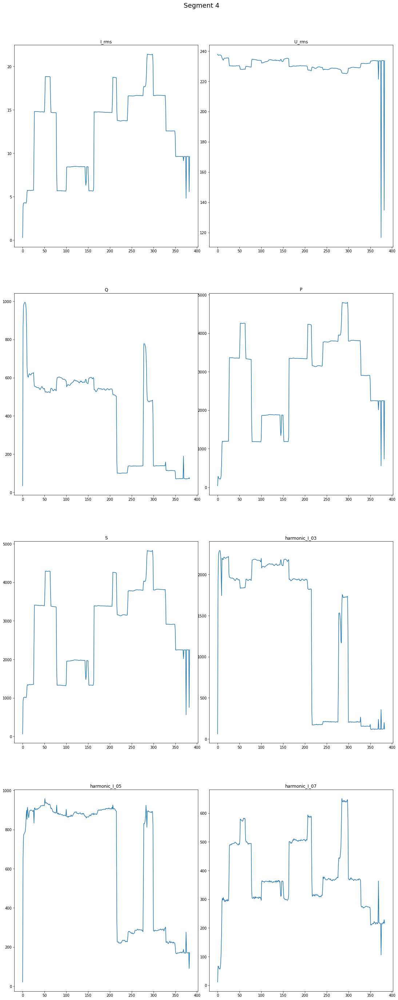

<Figure size 2560x1920 with 0 Axes>

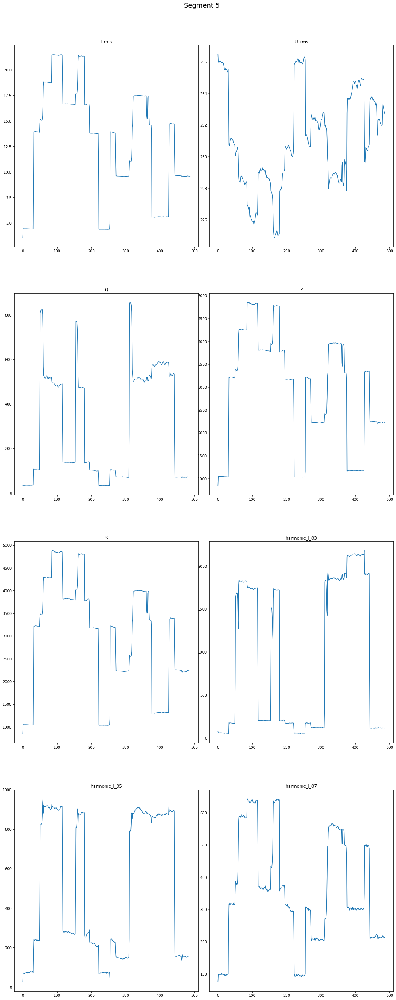

<Figure size 2560x1920 with 0 Axes>

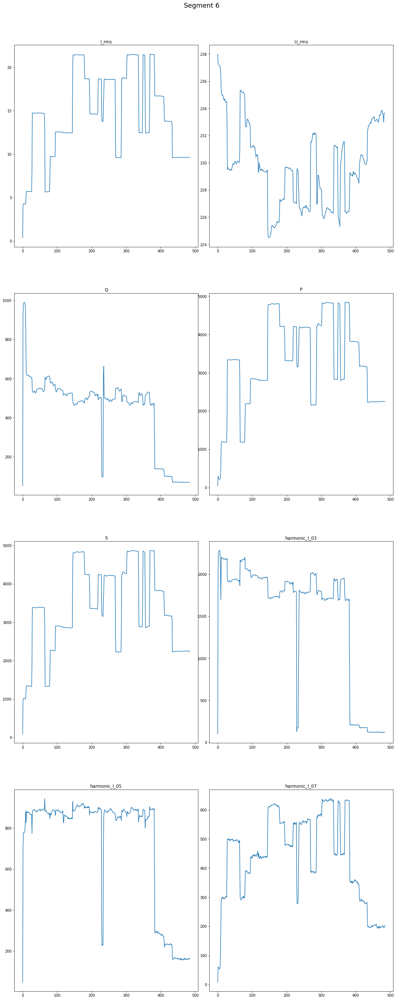

<Figure size 2560x1920 with 0 Axes>

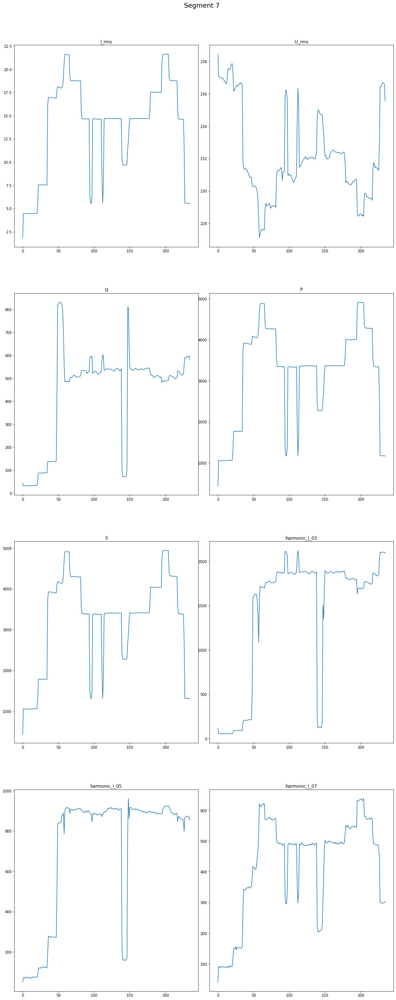

<Figure size 2560x1920 with 0 Axes>

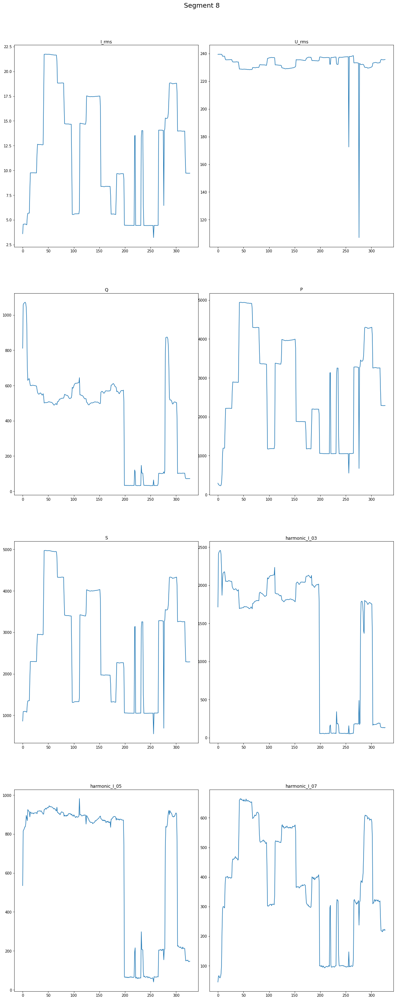

<Figure size 2560x1920 with 0 Axes>

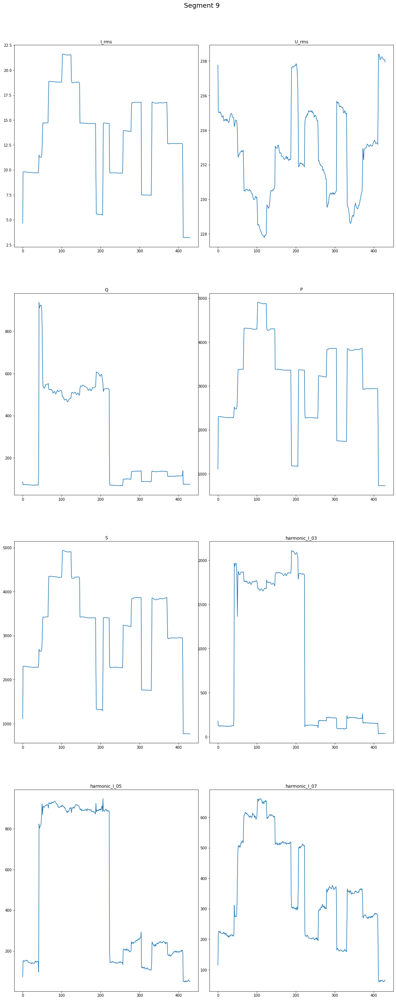

<Figure size 2560x1920 with 0 Axes>

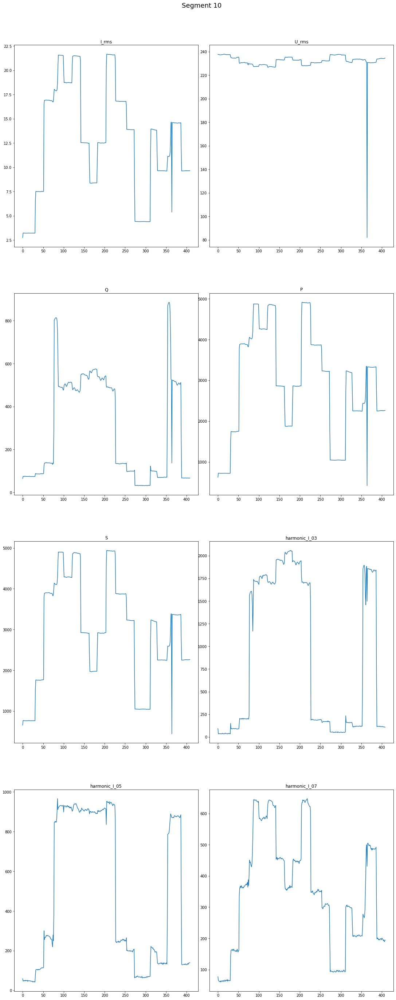

<Figure size 2560x1920 with 0 Axes>

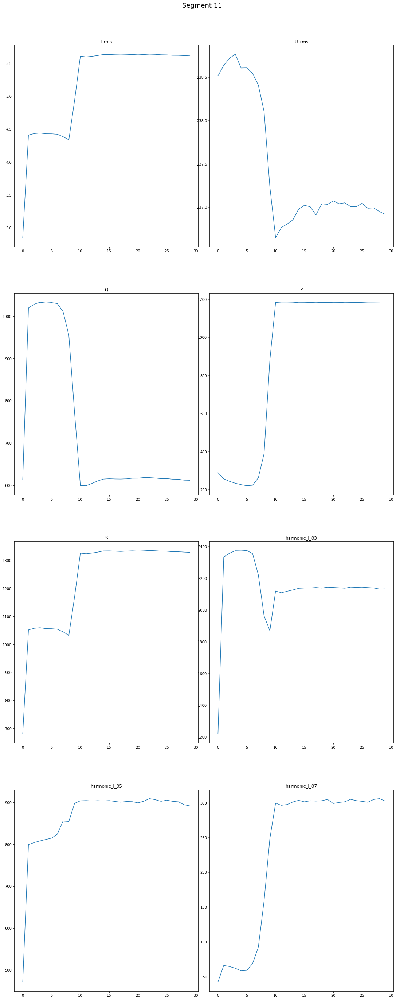

<Figure size 2560x1920 with 0 Axes>

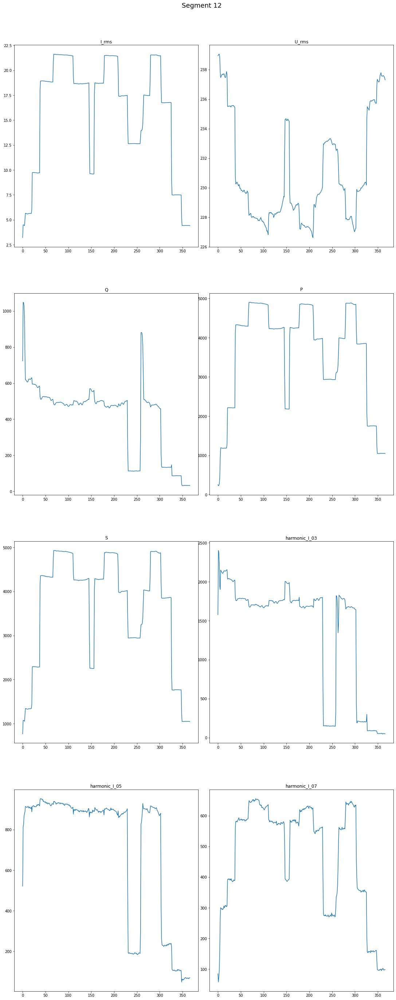

<Figure size 2560x1920 with 0 Axes>

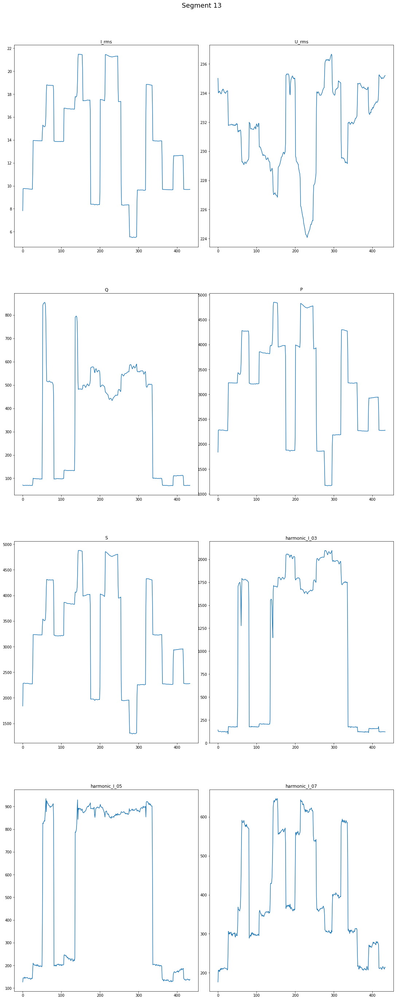

<Figure size 2560x1920 with 0 Axes>

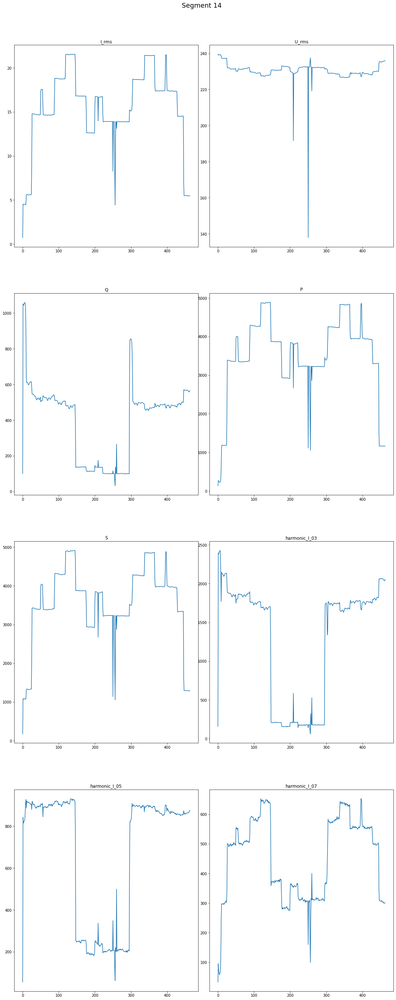

<Figure size 2560x1920 with 0 Axes>

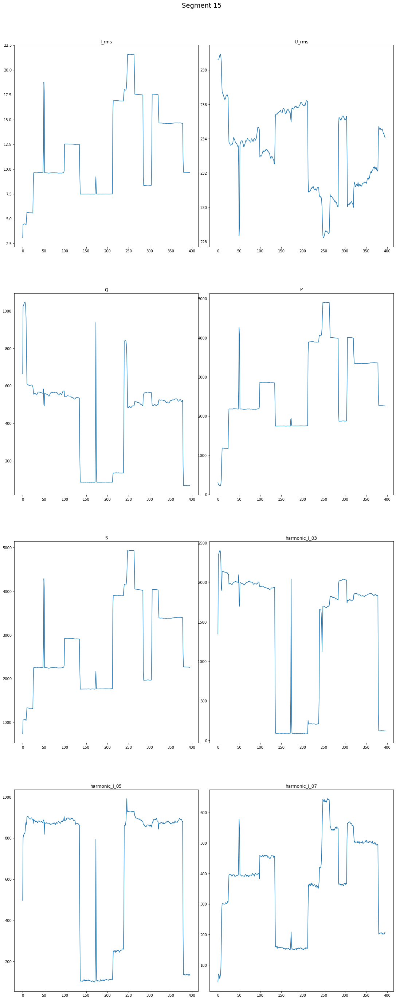

<Figure size 2560x1920 with 0 Axes>

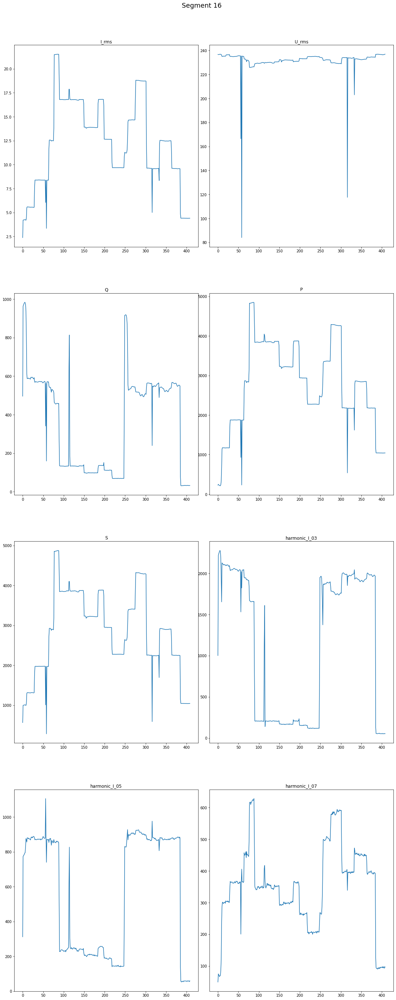

<Figure size 2560x1920 with 0 Axes>

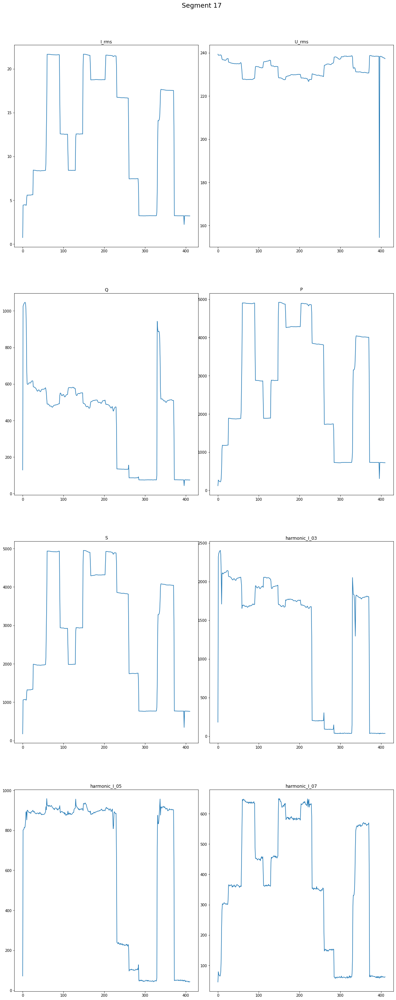

<Figure size 2560x1920 with 0 Axes>

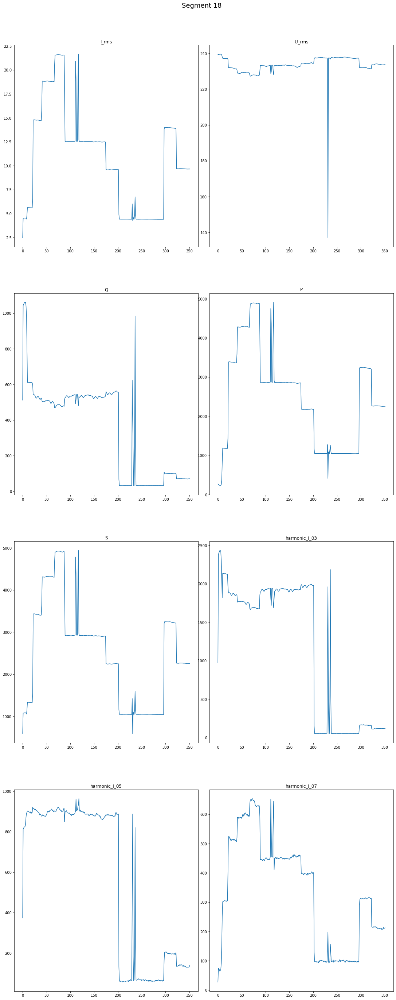

<Figure size 2560x1920 with 0 Axes>

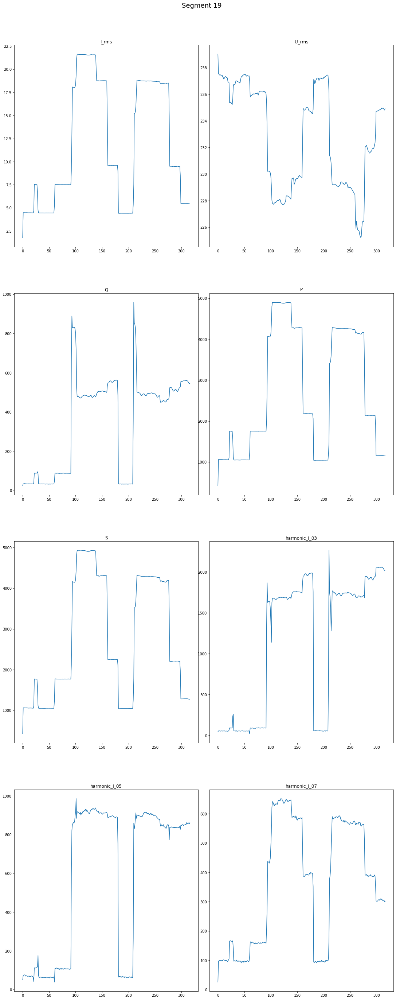

<Figure size 2560x1920 with 0 Axes>

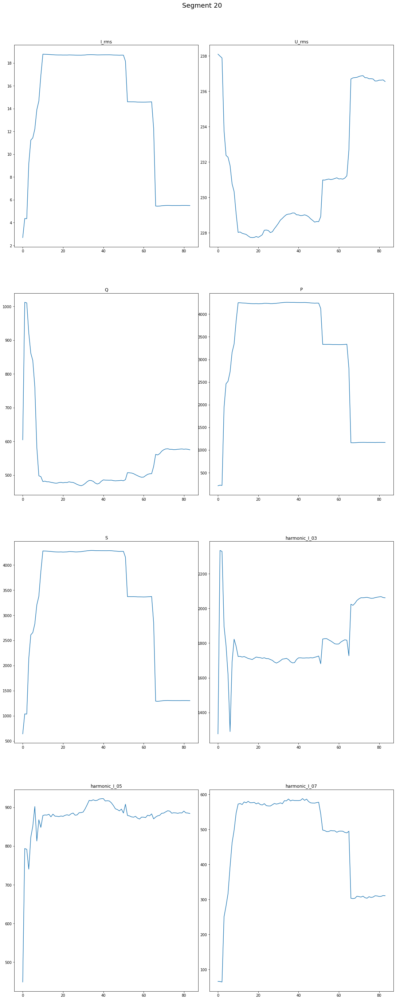

<Figure size 2560x1920 with 0 Axes>

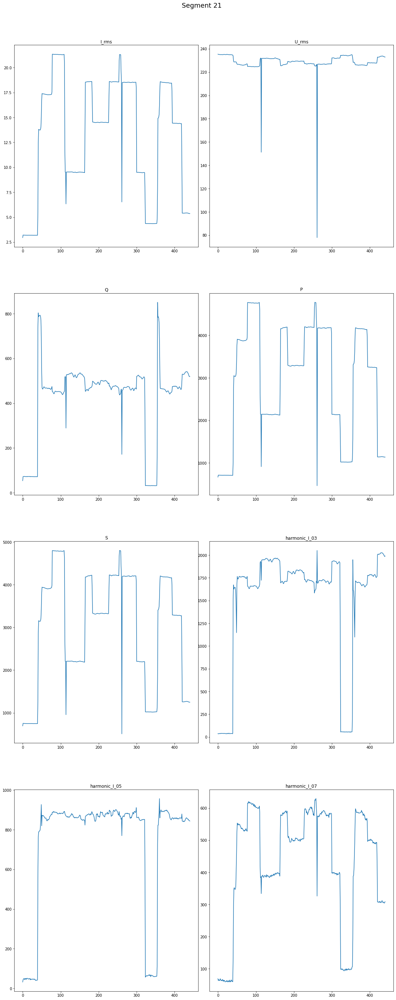

<Figure size 2560x1920 with 0 Axes>

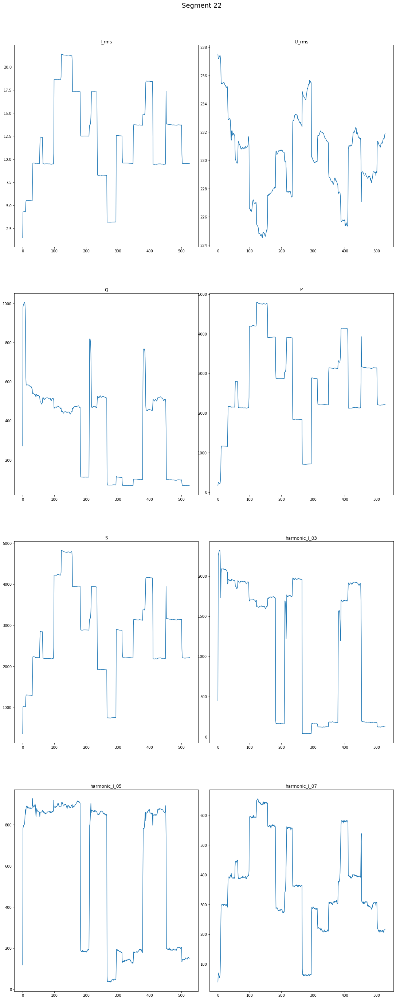

<Figure size 2560x1920 with 0 Axes>

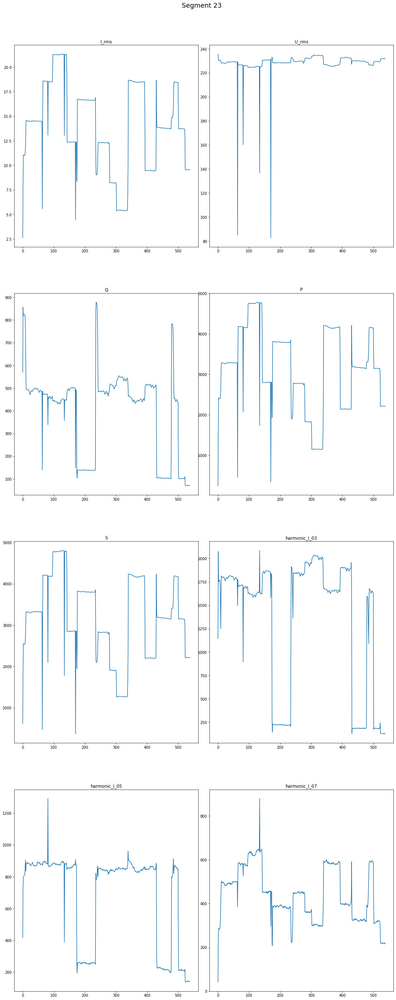

In [29]:
I_rms_np = np.array(df['I_rms'])
U_rms_np = np.array(df['U_rms'])
Q_np =  np.array(df['Q'])
P_np =  np.array(df['P'])
S_np =  np.array(df['S'])
harmonic_I_03_np = np.array(df['harmonic_I_03'])
harmonic_I_05_np = np.array(df['harmonic_I_05'])
harmonic_I_07_np = np.array(df['harmonic_I_07'])
np_stack = [I_rms_np, U_rms_np, Q_np ,P_np ,S_np ,harmonic_I_03_np ,harmonic_I_05_np ,harmonic_I_07_np]
titles = ['I_rms', 'U_rms', 'Q' ,'P' ,'S' ,'harmonic_I_03' ,'harmonic_I_05' ,'harmonic_I_07']
dict_graphs = dict(zip(titles, np_stack))


def create_graphs(j):
    
    """function plots all graphs for a given tuple with index j
    
    :parameter j an integer representing a segment."""
    
    x = tup_list[j]
    tup_0,tup_1 = x[0], x[1]
    figure(figsize=(16, 12), dpi=160)
    fig, axs = plt.subplots(df.shape[1]//2, 2)
    fig.suptitle('Segment {}'.format(j),fontsize=18)
    fig.tight_layout()
    fig.set_figheight(40)
    fig.set_figwidth(15)
    
    for i in range(0,len(np_stack),2):
        axs[i//2 , 0].plot(np_stack[i][tup_0:tup_1])
        axs[i//2 , 0].set_title(titles[i])
        axs[i//2 , 1].plot(np_stack[i+1][tup_0:tup_1])
        axs[i//2 , 1].set_title(titles[i+1])
        
        
for i in range(len(tup_list)):
    create_graphs(i)

#  Sum it up.

* We create a seperate DataFrame 'ts' to collect several features from the segments which we've found. 

In [34]:
column_names = ["length", "tup_0", "tup_1","total energy", "average energy/sec"]

ts = pd.DataFrame(columns = column_names)

for i in range(len(tup_list)):
    
    tup= tup_list[i]
    tup_0,tup_1 = tup[0],tup[1]
    length = (tup_1-tup_0)*0.2
    integral = int(np.cumsum(points[tup_0:tup_1])[-1])
    avg_energy_per_second = integral/length
    #row-add to the datafame ts 
    to_append = [length,tup_0,tup_1,integral,avg_energy_per_second]
    a_series = pd.Series(to_append, index = ts.columns)
    ts = ts.append(a_series, ignore_index=True)

In [35]:
NUMBER_OF_SEGMENTS = ts.shape[0]

In [36]:
ts

,length,tup_0,tup_1,total energy,average energy/sec
0,77.0,34.0,419.0,350037.0,4545.935065
1,45.4,509.0,736.0,297694.0,6557.136564
2,5.0,752.0,777.0,2806.0,561.200000
3,34.6,793.0,966.0,169926.0,4911.156069
4,76.8,1082.0,1466.0,499724.0,6506.822917
5,97.6,1491.0,1979.0,450002.0,4610.676230
6,97.0,2031.0,2516.0,726890.0,7493.711340
7,47.0,2545.0,2780.0,331912.0,7061.957447
8,65.6,2807.0,3135.0,437866.0,6674.786585
9,86.0,3178.0,3608.0,366074.0,4256.674419


In [37]:
ts.describe()

,length,tup_0,tup_1,total energy,average energy/sec
count,24.000000,24.000000,24.000000,24.000000,24.000000
mean,69.508333,4288.666667,4636.208333,417794.458333,6076.792829
std,29.333820,2812.570133,2859.603393,188998.050601,1879.480195
min,5.000000,34.000000,419.000000,2806.000000,561.200000
25%,59.300000,1896.000000,2381.750000,345505.750000,5144.465285
50%,78.100000,4137.000000,4335.500000,443934.000000,6350.575381
75%,87.150000,6659.500000,7055.750000,522641.250000,6836.887927
max,107.800000,9069.000000,9608.000000,726890.000000,10686.500000


Text(0.5, 1.0, 'average power by segments')

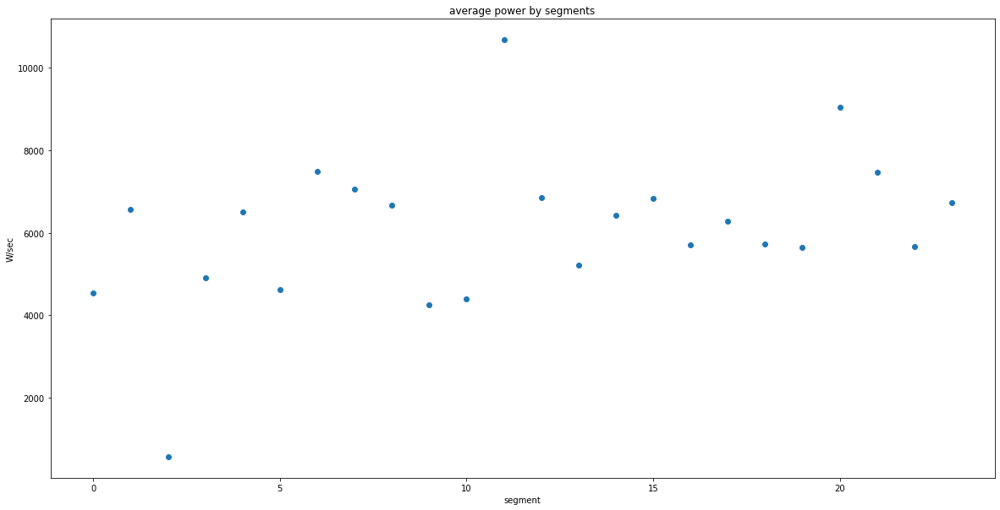

In [38]:
plt.scatter(ts.index, ts['average energy/sec'])
plt.xlabel('segment')
plt.ylabel('W/sec')
plt.title('average power by segments')

In [39]:
from sklearn.cluster import KMeans

In [40]:
class Km:
    
    """class to implement Kmeans on previous collected data"""
    
    def __init__(self,k,ts,num_random_states):
        self.ts=ts
        self.k=k
        self.iterates = num_random_states
        self.threshold = num_random_states-2
        
    def apply_kmeans(self):
        X = np.array(ts['average energy/sec']).reshape(self.ts.shape[0],1)
        Y = np.array(ts['length']).reshape(self.ts.shape[0],1)
        X_tag = np.hstack((Y,X))
        result_list=[]
        result_dict = {}
        for j in range(self.iterates):
            kmeans = KMeans(n_clusters=self.k, random_state=j).fit(X_tag)
            labels = kmeans.labels_
            result_dict = {i:np.where(labels ==i)[0].tolist() for i in range(self.k)}
            result_list.append(result_dict)
        return result_list
    
    @staticmethod
    def _find_cluster(cluster_dict,k):
        
        """function recieve clustering dictionary, and segment number k.
       returns the cluster for segment k as a list.
       
       :parameters 
               cluster_dict, dictionary
               k, int 
       :returns a list """
    
        d_bool = {j: k in cluster_dict[j] for j in cluster_dict.keys()}
        return cluster_dict[list(filter(d_bool.get, d_bool))[0]]
    
    def sum_results(self, cluster_dict ):
        
        """function creates square matrix (universe x universe) to summarize the occurences of segments appearing in
        the same cluster by kmeans (over the average energy and time length). """
        
        
        mat = np.zeros((self.ts.shape[0],self.ts.shape[0]))
        for seg_r in range(self.ts.shape[0]):
            for universe in range(len(cluster_dict)):
                for term in self._find_cluster(cluster_dict[universe],seg_r):
                    mat[seg_r,term]+=1
                    
        return mat - len(cluster_dict)*np.identity(mat.shape[0])

                    
                
    def find_cluster(self,mat,i):
        bool_arr = mat[i] > self.threshold
        return np.where(bool_arr)[0]
                
                                     
            
        
    
                 

* run Kmeans on ts and show clusters:

In [41]:
km = Km(ts=ts,k=6,num_random_states=10)
li = km.apply_kmeans()
mat = km.sum_results(li)

for i in range(ts.shape[0]):
    print(i,km.find_cluster(mat,i))


0 [ 3  5  9 10]
1 [ 4  6  7  8 12 14 15 17 21 23]
2 []
3 [ 0  5  9 10]
4 [ 1  6  7  8 12 14 15 17 21 23]
5 [ 0  3  9 10]
6 [ 1  4  7  8 12 14 15 17 21 23]
7 [ 1  4  6  8 12 14 15 17 21 23]
8 [ 1  4  6  7 12 14 15 17 21 23]
9 [ 0  3  5 10]
10 [0 3 5 9]
11 []
12 [ 1  4  6  7  8 14 15 17 21 23]
13 [16 18 19 22]
14 [ 1  4  6  7  8 12 15 17 21 23]
15 [ 1  4  6  7  8 12 14 17 21 23]
16 [13 18 19 22]
17 [ 1  4  6  7  8 12 14 15 21 23]
18 [13 16 19 22]
19 [13 16 18 22]
20 []
21 [ 1  4  6  7  8 12 14 15 17 23]
22 [13 16 18 19]
23 [ 1  4  6  7  8 12 14 15 17 21]


To check if that's any good: 

* we will plot graphs for a given segment.

In [42]:
def plot_segment_graph(seg,graph,dict_graphs=dict_graphs):
    
    """plotting auxilary 
    :parameters: seg: integer representing segment number,
                 graph_num, integer, representing which graph to plot (from P,S etc.. )"""
    
    x = tup_list[seg]
    tup_0,tup_1 = x[0], x[1]
    plt.plot(dict_graphs[graph][tup_0:tup_1])

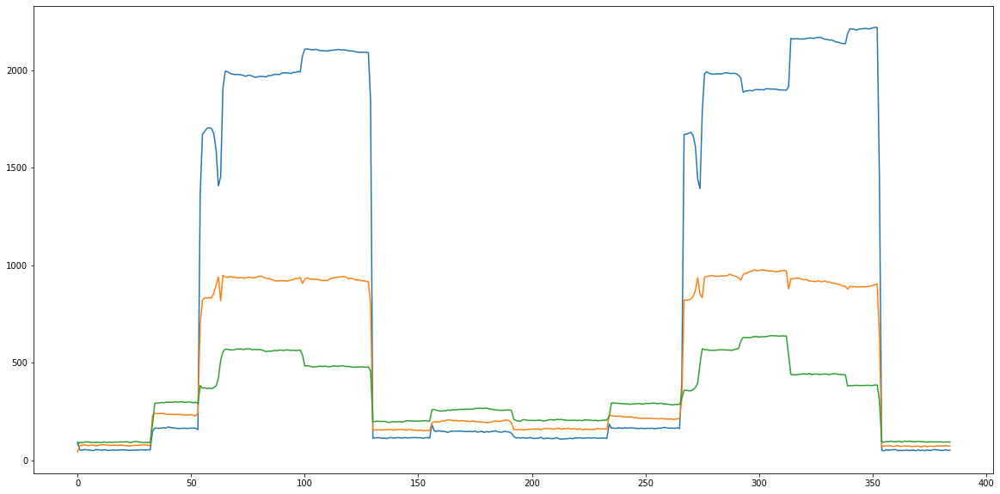

In [43]:
plot_segment_graph(0,'harmonic_I_03')
plot_segment_graph(0,'harmonic_I_05')
plot_segment_graph(0,'harmonic_I_07')

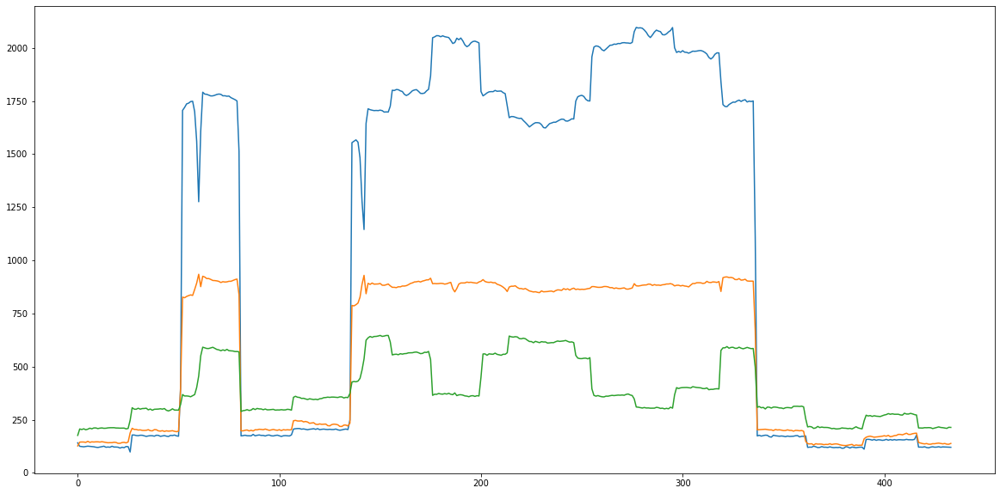

In [44]:
plot_segment_graph(13,'harmonic_I_03')
plot_segment_graph(13,'harmonic_I_05')
plot_segment_graph(13,'harmonic_I_07')

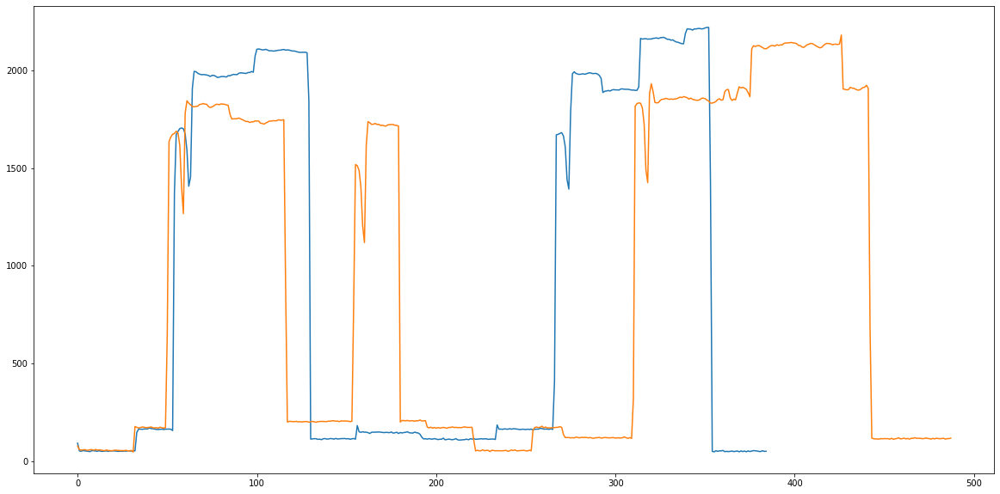

In [45]:
plot_segment_graph(0,'harmonic_I_03')
plot_segment_graph(5,'harmonic_I_03')

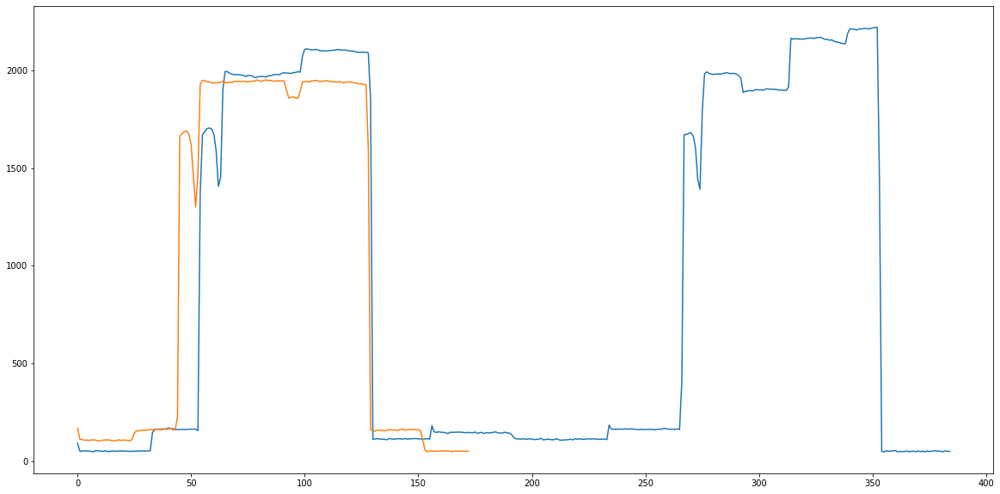

In [46]:
plot_segment_graph(0,'harmonic_I_03')
plot_segment_graph(3,'harmonic_I_03')

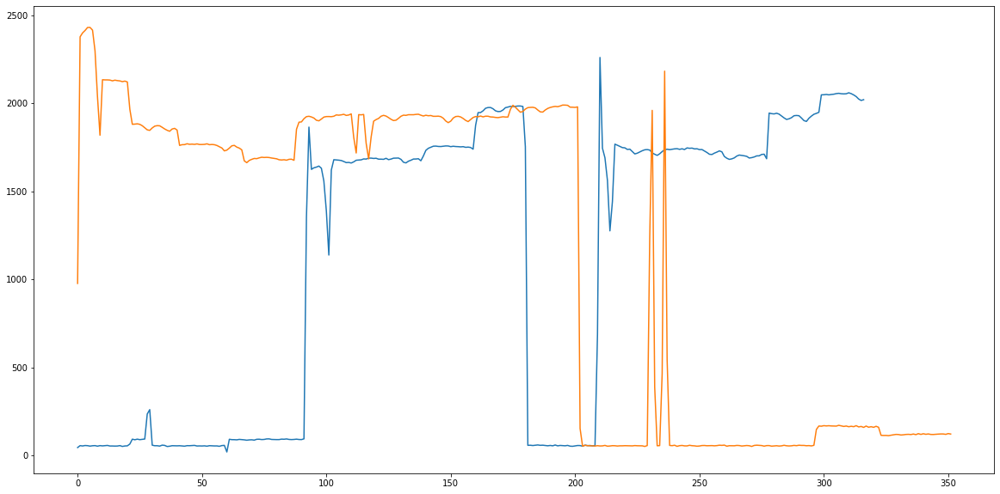

In [49]:
plot_segment_graph(19,'harmonic_I_03')
plot_segment_graph(18,'harmonic_I_03')

# Cross correlation 


In [50]:
x,y = tup_list[0],tup_list[10]

In [51]:
max(np.correlate(np_stack[5][x[0]:x[1]],np_stack[5][y[0]:y[1]],'full'))

439608225.63667333

In [52]:
def find_max_corr(seg,graph,dict_graphs=dict_graphs):
    
    """:parameters: 
                seg, a segment index
                graph, a string from (I_rms,U_rms, P,S,..)
       :returns:
                maximum index paired with i, and the maximum cross correlation value. """
    
    ind_x = tup_list[seg]
    graph_v = dict_graphs[graph]
    maximum_ind = None
    maximum_value = -1 
    for j in range(len(tup_list)):
        if seg == j:
            continue
        ind_y = tup_list[j]
        vec_x,vec_y = graph_v[ind_x[0]:ind_x[1]],graph_v[ind_y[0]:ind_y[1]]
        val = max(np.correlate(vec_x,vec_y,'full'))
        if val > maximum_value:
            maximum_ind = j
            maximum_value = val      
    return maximum_ind, maximum_value 
        
        
        

In [53]:
find_max_corr(1,'harmonic_I_03')

(4, 612761059.948508)

In [54]:
for i in range(len(tup_list)):  
    print(find_max_corr(i,'harmonic_I_03'))

(6, 665810799.3087769)
(4, 612761059.948508)
(0, 6129966.582721116)
(4, 361341245.0610397)
(6, 966911103.912272)
(6, 800247031.3646938)
(21, 1167374257.738429)
(4, 671386056.9994576)
(4, 852786462.0065969)
(6, 700927318.2158012)
(6, 690933950.1404071)
(0, 139855959.82924068)
(6, 961656994.7616271)
(6, 826708212.3715613)
(23, 936462642.28808)
(6, 1035586934.4284439)
(6, 878404960.5680363)
(6, 988813257.9504468)
(4, 793618954.1318786)
(6, 681486668.4744405)
(4, 325296039.5268057)
(6, 1167374257.738429)
(6, 890095592.8721453)
(6, 1123093512.2033882)


# does not seem to work well .

# We presumably should have normalized the arrays => pearson coefficient:

In [55]:
graph = np_stack[5]
x= tup_list[0]
y= tup_list[3]
s1 = pd.Series(graph[x[0]:x[1]])
s2 = pd.Series(graph[y[0]:y[1]])
s1.corr(s2,method = 'pearson')

0.9192841458586243

# segment 0 and 3 shows strong correlation => may originated from the same device.

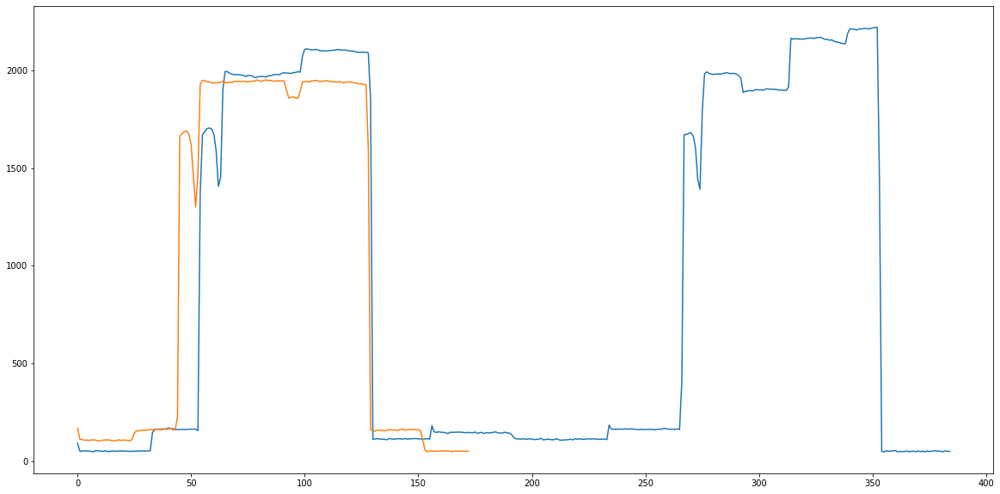

In [56]:
plot_segment_graph(0,'harmonic_I_03')
plot_segment_graph(3,'harmonic_I_03')

In [58]:
def find_pearson(seg_n1,seg_n2,graph_number):
    
    """computes pearson correlation cooeffient between seg_n1,seg_n2 for graph_number.
        returns its pearson coeffient."""
    
    graph = np_stack[graph_number]
    x= tup_list[seg_n1]
    y= tup_list[seg_n2]
    s1 = pd.Series(graph[x[0]:x[1]])
    s2 = pd.Series(graph[y[0]:y[1]])
    return s1.corr(s2,method = 'pearson')

In [59]:
find_pearson(4,8,5)

0.8506067352599215

# Let's compute all of the pearsons coefficients between all segments.

In [60]:
for i in range(24):
    for j in range(i+1,24):
        print((i,j),find_pearson(i,j,5))

(0, 1) 0.5125223930203352
(0, 2) -0.1442605059144665
(0, 3) 0.9192841458586243
(0, 4) -0.05386739882222988
(0, 5) 0.39070944431008553
(0, 6) 0.17359816088519636
(0, 7) 0.4056373926052646
(0, 8) 0.050058753409751126
(0, 9) -0.031832349218473194
(0, 10) -0.26626466431343115
(0, 11) -0.8375239861011531
(0, 12) -0.21731624900645025
(0, 13) 0.02106901231920575
(0, 14) 0.3180135268692516
(0, 15) 0.52069360128248
(0, 16) 0.23145236239698647
(0, 17) -0.18510916980529651
(0, 18) -0.2465013864858189
(0, 19) 0.1738081286337436
(0, 20) 0.6414050402761632
(0, 21) -0.023851383215592364
(0, 22) -0.3089043534817512
(0, 23) 0.37936967924659326
(1, 2) -0.1970081423016268
(1, 3) 0.42355031013265604
(1, 4) 0.35456611000132227
(1, 5) 0.3725418039752287
(1, 6) 0.18759894602665694
(1, 7) 0.0023420622295353116
(1, 8) 0.36384574901428984
(1, 9) 0.09100358118252498
(1, 10) -0.20694677880975676
(1, 11) -0.003071363908526288
(1, 12) -0.1133723341669051
(1, 13) -0.3668257572887749
(1, 14) 0.5446870758483335
(1, 15

* checking segments with high Pearson:

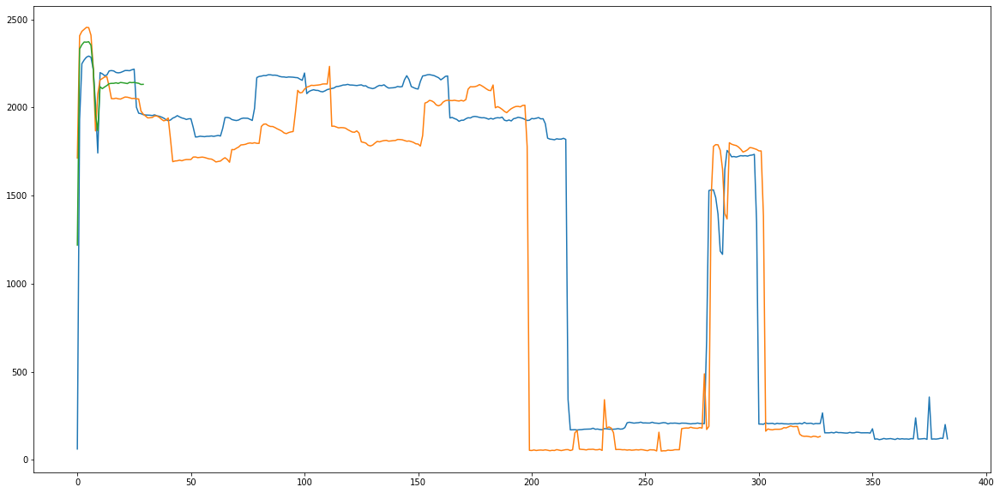

In [61]:
plot_segment_graph(4,'harmonic_I_03')
plot_segment_graph(8,'harmonic_I_03')
plot_segment_graph(11,'harmonic_I_03')

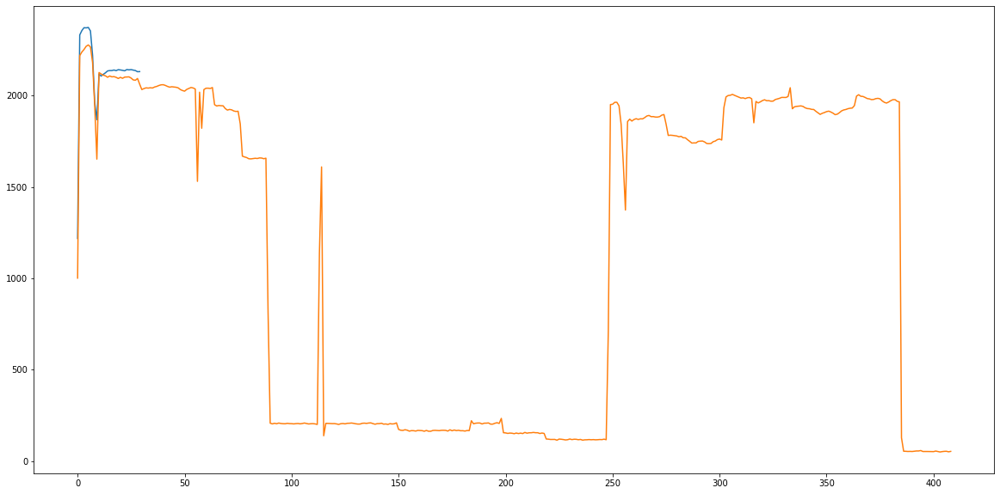

In [63]:
plot_segment_graph(11,'harmonic_I_03')
plot_segment_graph(16,'harmonic_I_03')

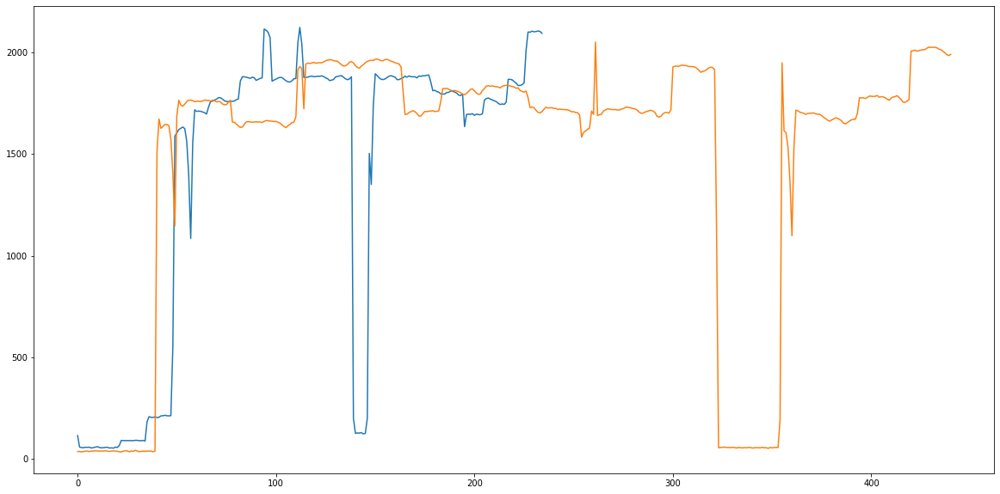

In [65]:
plot_segment_graph(7,'harmonic_I_03')
plot_segment_graph(21,'harmonic_I_03')

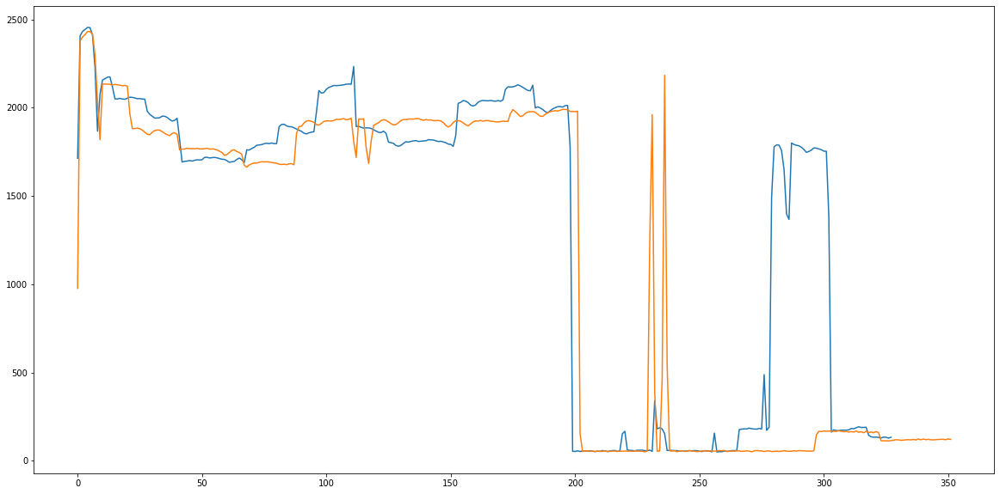

In [67]:
plot_segment_graph(8,'harmonic_I_03')
plot_segment_graph(18,'harmonic_I_03')

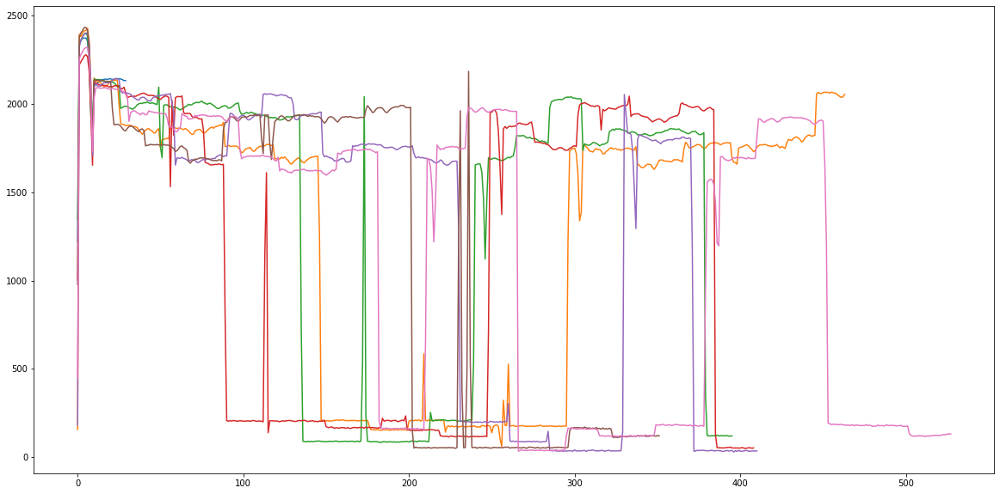

In [68]:
plot_segment_graph(11,'harmonic_I_03')
plot_segment_graph(14,'harmonic_I_03')
plot_segment_graph(15,'harmonic_I_03')
plot_segment_graph(16,'harmonic_I_03')
plot_segment_graph(17,'harmonic_I_03')
plot_segment_graph(18,'harmonic_I_03')
plot_segment_graph(22,'harmonic_I_03')

In [69]:
def predict_similliar_segments(seg,threshold = 0.55):
    
    """function returns similiar segments to seg (int) by using the pearson correllation."""
    
    l = []
    for j in range(NUMBER_OF_SEGMENTS):
        if j == seg:
            continue
        if find_pearson(seg,j,5) >= threshold:
            l.append(j)
    return l

In [70]:
predict_similliar_segments(1,threshold = 0.6)

[23]

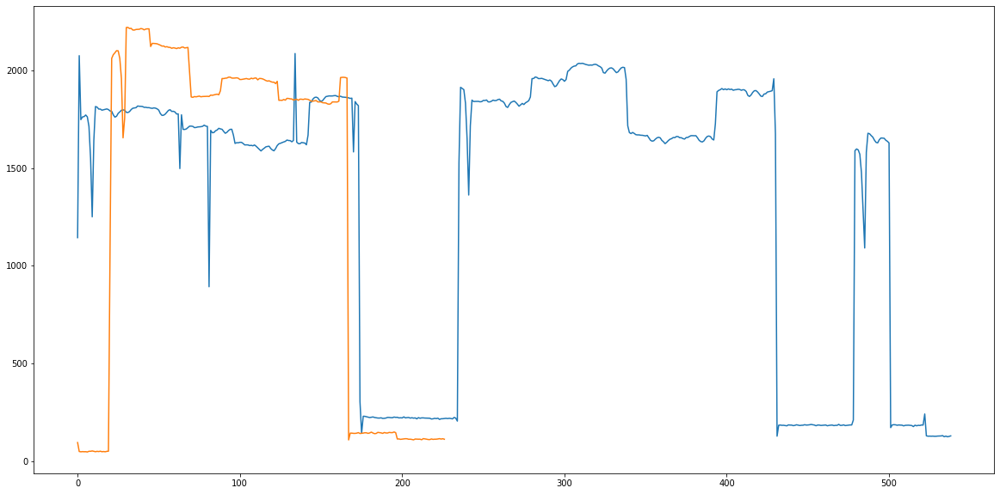

In [71]:
plot_segment_graph(23,'harmonic_I_03')
plot_segment_graph(1,'harmonic_I_03')

Therefore, I would consider 2 sigals to come from the same device if their Pearson coeeficient is high enough with respect to their harmonic_I_NN graphs.   

In [72]:
for i in range(NUMBER_OF_SEGMENTS):
    print(i,predict_similliar_segments(i,threshold = 0.7))

0 [3]
1 [23]
2 []
3 [0]
4 [8, 11, 12, 18]
5 []
6 [11]
7 [21]
8 [4, 11, 18]
9 []
10 []
11 [4, 6, 8, 14, 15, 16, 17, 18, 22, 23]
12 [4]
13 []
14 [11]
15 [11, 16]
16 [11, 15]
17 [11, 18]
18 [4, 8, 11, 17]
19 []
20 []
21 [7]
22 [11]
23 [1, 11]


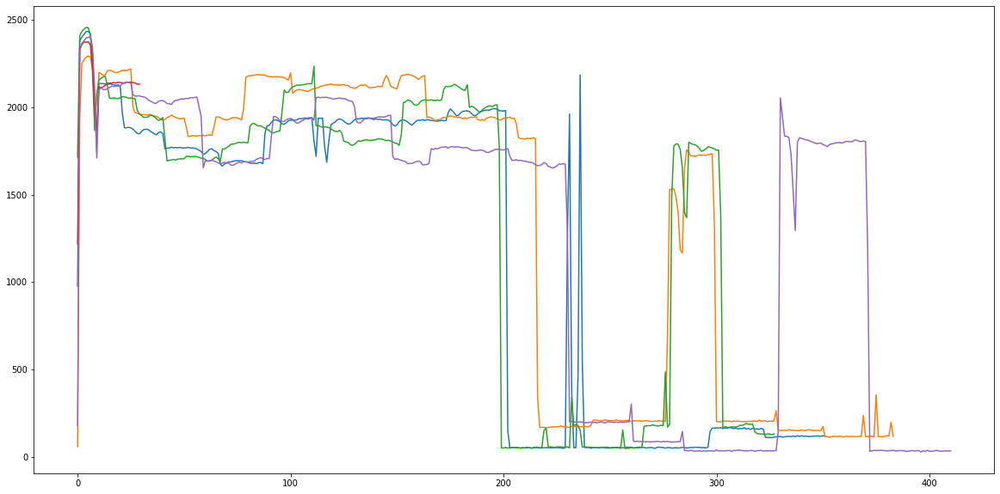

In [73]:
plot_segment_graph(18,'harmonic_I_03')
plot_segment_graph(4,'harmonic_I_03')
plot_segment_graph(8,'harmonic_I_03')
plot_segment_graph(11,'harmonic_I_03')
plot_segment_graph(17,'harmonic_I_03')

* to make sure the pearson is computed over all possible configurations, we will do the following:

# Sliding window with Pearson

In [74]:
def sliding_window(vec,len_pad):
    """function recieves vec (np.array) and padding length (int) and returns a np matrix representing its sliding window 
       :parameters: vec np.array of 1 dimension.
                    len_pad an integer."""
    
    len_vec = len(vec)
    pad_mat = np.zeros((len_pad+1,len_vec+len_pad))
    for col in range(pad_mat.shape[0]):
        pad_mat[col,col:len_vec+col] = vec
    return pad_mat



def crop_window(vec,len_crop):
    
    """function recieves vec (np.array) and crop length (int) and returns a np matrix representing its cropped window 
       :parameters: vec np.array of 1 dimension.
                    len_pad an integer."""
    
    len_vec = len(vec)
    crop_mat = np.zeros((len_vec-len_crop +1,len_crop))
    for col in range(crop_mat.shape[0]):
        crop_mat[col] = vec[col:col+len_crop]
    return crop_mat


def calc_correlations(mat,vec):
    
    """calculates the pearson coeficient for each row in mat with vec"""
    l = []
    for col in range(mat.shape[0]):
        l.append(np.corrcoef(mat[col],vec)[1,0])
    return l
        
        
        
def pearson_by_sliding(vec,window):
    
    """parameters: vec and window np arrays
       :returns "a list of pearson coeficients ordered by the possible cropping starting index. """
    
    len_vec,len_window = len(vec),len(window)
    
    assert len(vec) > len(window), "Oh no! Window size too great :-( !"
    
    mat = crop_window(vec,len_window)
    
    return calc_correlations(mat,window)

* example: by sliding we pad zeros to the shorter vector ; by cropping we crop the bigger vector:

In [75]:
sliding_window(np.array([1,2,3]),5)

array([[1., 2., 3., 0., 0., 0., 0., 0.],
       [0., 1., 2., 3., 0., 0., 0., 0.],
       [0., 0., 1., 2., 3., 0., 0., 0.],
       [0., 0., 0., 1., 2., 3., 0., 0.],
       [0., 0., 0., 0., 1., 2., 3., 0.],
       [0., 0., 0., 0., 0., 1., 2., 3.]])

In [76]:
crop_window(np.array([1,2,3,4,5]),3)

array([[1., 2., 3.],
       [2., 3., 4.],
       [3., 4., 5.]])

# illustration: sliding windows

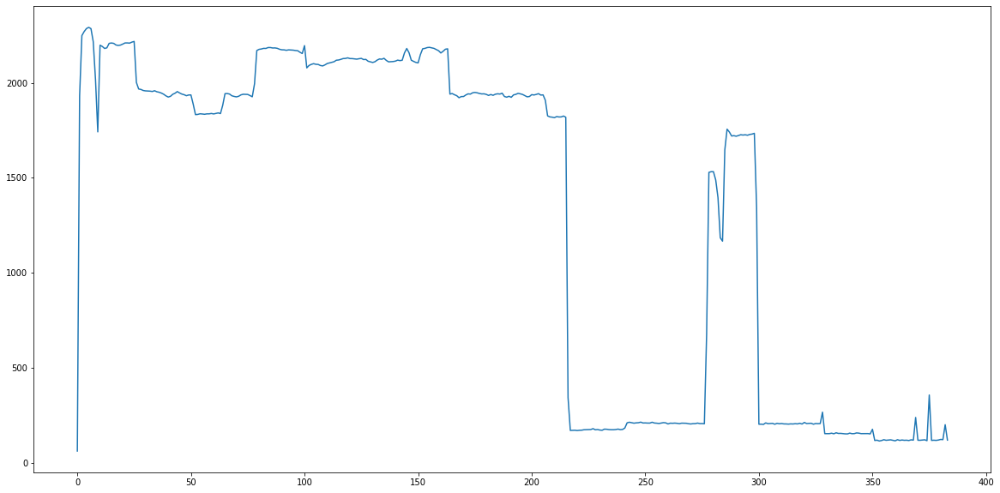

In [77]:
plot_segment_graph(4,'harmonic_I_03')

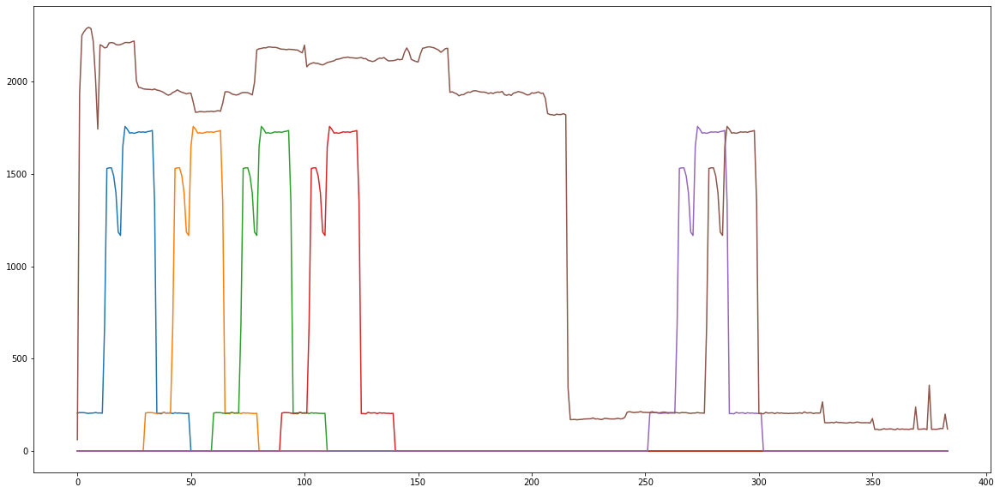

In [78]:
x = tup_list[4]
graph_v = dict_graphs['harmonic_I_03']
vec_x = graph_v[x[0]:x[1]][265:315]
mat = sliding_window(vec_x, len(graph_v[x[0]:x[1]]) - len(vec_x))
plt.plot(mat[0])
plt.plot(mat[30])
plt.plot(mat[60])
plt.plot(mat[90])
plt.plot(mat[252])
plt.plot(graph_v[x[0]:x[1]])

the pearson coeficient for this allignment is: 0.6839554640648287


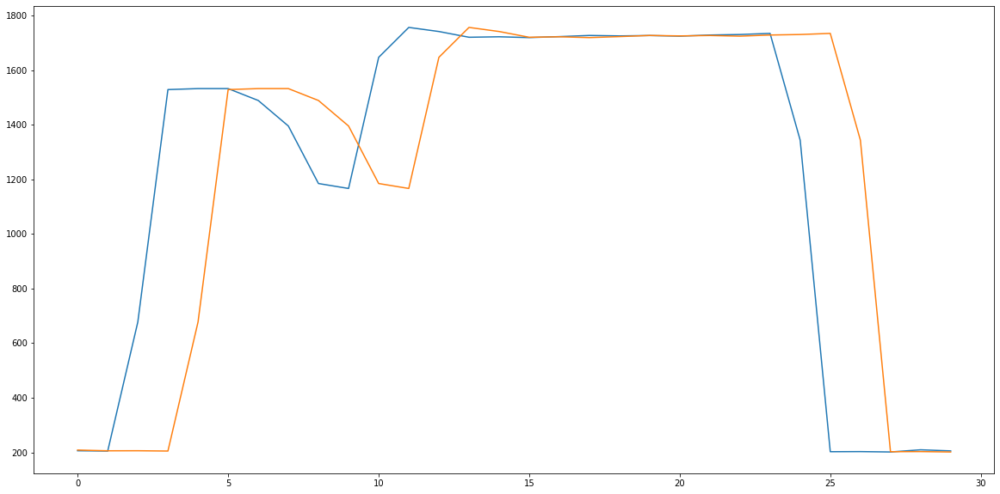

In [79]:
k=273
x = tup_list[4]
vec_x = graph_v[x[0]:x[1]][275:305]
gr = graph_v[x[0]:x[1]][k:len(vec_x)+k]

print('the pearson coeficient for this allignment is:',  np.corrcoef(gr,vec_x)[1,0])

plt.plot(vec_x)
plt.plot(gr)

In [80]:
x = tup_list[10]
pearson_list = pearson_by_sliding(graph_v[x[0]:x[1]],vec_x)
a = [a for a in range(len(pearson_list))]
[ i for (i,j) in zip(a,pearson_list) if j >= 0.8 ]

[97, 98, 99, 160]

In [81]:
print(np.max(pearson_by_sliding(graph_v[x[0]:x[1]],vec_x)))
print(np.argmax(pearson_by_sliding(graph_v[x[0]:x[1]],vec_x)))

0.8687258641376955
98


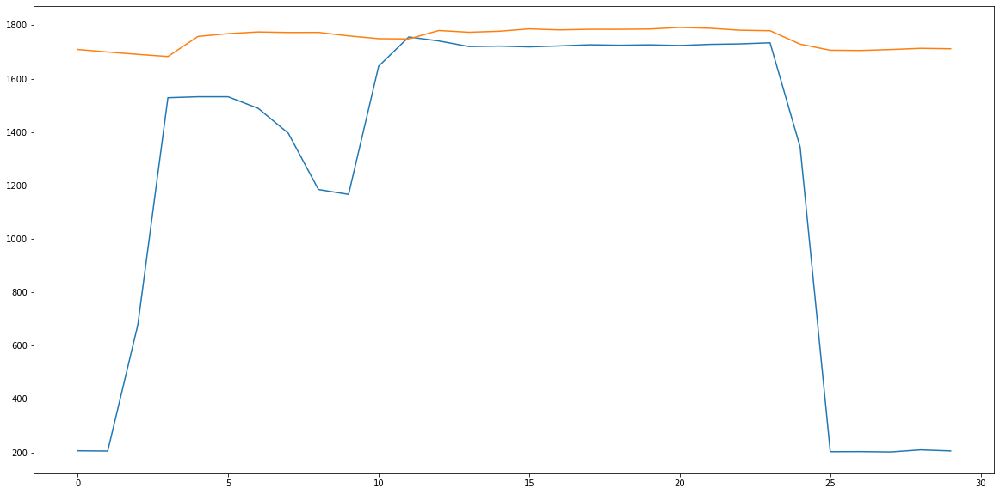

In [82]:
k=97
plt.plot(vec_x)
plt.plot(graph_v[x[0]:x[1]][k:k+len(vec_x)])

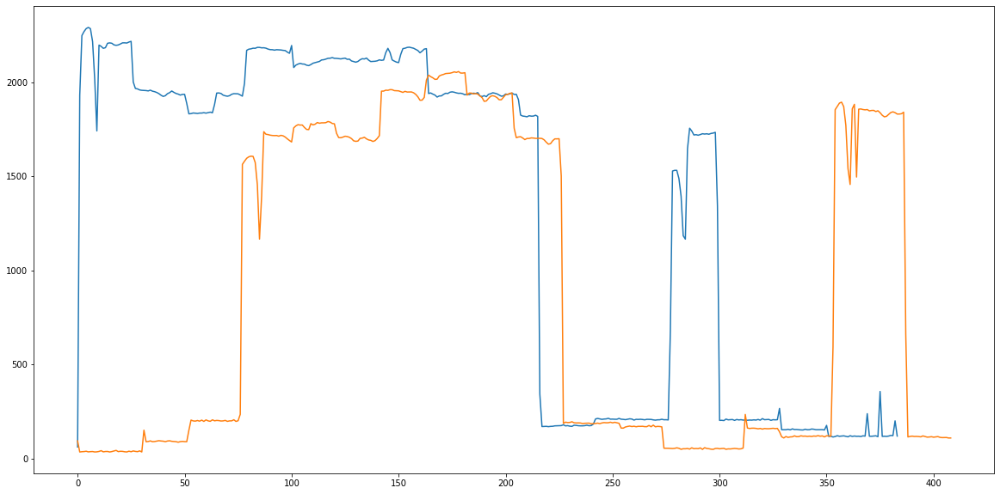

In [83]:
plot_segment_graph(4,'harmonic_I_03')
plot_segment_graph(10,'harmonic_I_03')

# Dynamic Time Wrapping

In [84]:
from scipy.spatial.distance import euclidean

from fastdtw import fastdtw

def dtw_find_min(k,r,dict_graphs=dict_graphs):
    """ apply dtw on segment k to return r most similliar segments.
        
        :parameters k segment index
                   r number of items most similiar with k to return
        :returns list of tuples [(index,distance)]"""
    
    res = []
    a,b = tup_list[k]
    for i in range(len(tup_list)):
        if i ==k:
            continue
        c,d = tup_list[i]
        x = dict_graphs['harmonic_I_03'][a:b]
        y = dict_graphs['harmonic_I_03'][c:d]
        distance, path = fastdtw(x, y, dist=euclidean)
        res.append((i,distance))
        
    res.sort(key=lambda x: x[1])
    return res[:r]

In [85]:
dtw_find_min(17,5)

[(12, 32222.810921861834),
 (8, 38024.8908888186),
 (16, 39501.652547900354),
 (18, 49224.20654968709),
 (15, 49439.64316551085)]

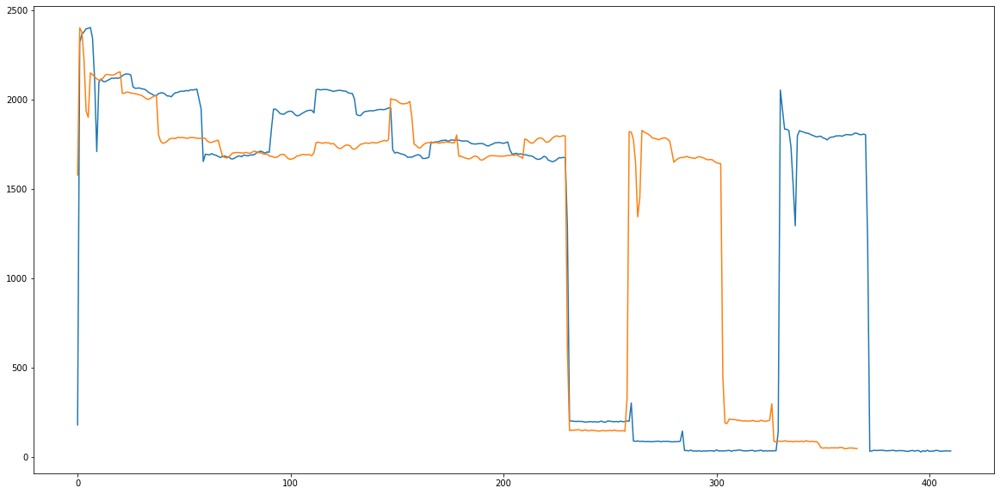

In [86]:
plot_segment_graph(17,'harmonic_I_03')
plot_segment_graph(12,'harmonic_I_03')

In [87]:
dtw_find_min(4,5)

[(8, 34278.526352555346),
 (12, 37559.48990168942),
 (15, 41013.889313790794),
 (18, 51878.473696107016),
 (1, 56314.73816093435)]

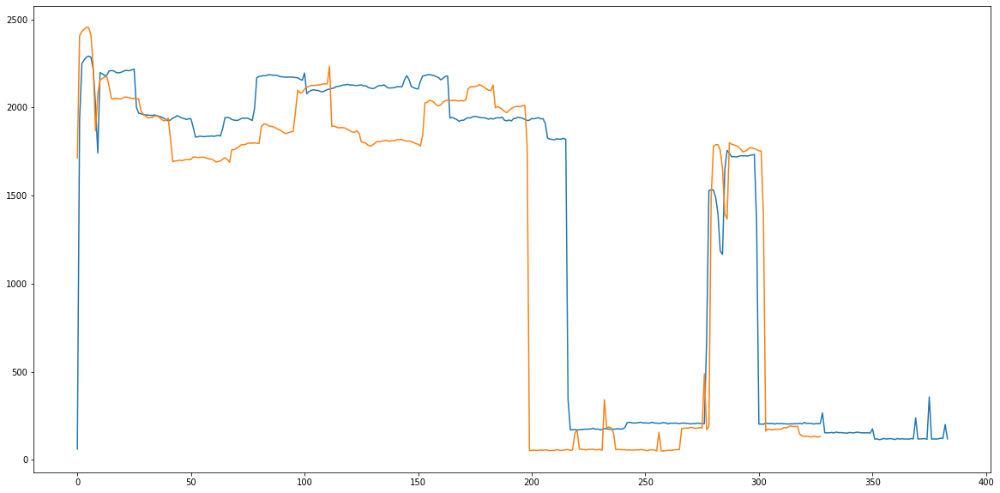

In [88]:
plot_segment_graph(4,'harmonic_I_03')
plot_segment_graph(8,'harmonic_I_03')

To answer the following question: 

"Based on the different feature values associated with different
    devices, can you say anything about the kinds of device they are?
    (Give clear reasons for your answers.)"

I will use first the clustering from the Kmeans. I see there  3 clusters:
    
    *  [0 3  5  9 10]
    *  [1 4  6  7  8 12 14 15 17 21 23]
    * [13 16 18 19 22]
    (*) layouts [2,11,20]
    
and I could assign the mean power as feature for these clusters. 


In [89]:
ts.iloc[[0,3,5,9,10]]

,length,tup_0,tup_1,total energy,average energy/sec
0,77.0,34.0,419.0,350037.0,4545.935065
3,34.6,793.0,966.0,169926.0,4911.156069
5,97.6,1491.0,1979.0,450002.0,4610.676230
9,86.0,3178.0,3608.0,366074.0,4256.674419
10,81.8,3657.0,4066.0,359186.0,4391.026895


In [90]:
ts.iloc[[0,3,5,9,10]].mean()

length                    75.400000
tup_0                   1830.600000
tup_1                   2207.600000
total energy          339045.000000
average energy/sec      4543.093735
dtype: float64

In [91]:
ts.iloc[[1,4,  6,  7,  8, 12, 14, 15, 17, 21, 23]]

,length,tup_0,tup_1,total energy,average energy/sec
1,45.4,509.0,736.0,297694.0,6557.136564
4,76.8,1082.0,1466.0,499724.0,6506.822917
6,97.0,2031.0,2516.0,726890.0,7493.711340
7,47.0,2545.0,2780.0,331912.0,7061.957447
8,65.6,2807.0,3135.0,437866.0,6674.786585
12,73.4,4165.0,4532.0,502285.0,6843.119891
14,92.8,5101.0,5565.0,595657.0,6418.717672
15,79.2,5629.0,6025.0,541317.0,6834.810606
17,82.2,6538.0,6949.0,516416.0,6282.433090
21,88.2,7977.0,8418.0,659366.0,7475.804989


In [92]:
ts.iloc[[1,4,  6,  7,  8, 12, 14, 15, 17, 21, 23]].mean()

length                    77.763636
tup_0                   4313.909091
tup_1                   4702.727273
total energy          530323.636364
average energy/sec      6806.314436
dtype: float64

In [93]:
ts.iloc[[13, 16, 18, 19, 22]]

,length,tup_0,tup_1,total energy,average energy/sec
13,86.8,4618.0,5052.0,453290.0,5222.235023
16,81.8,6086.0,6495.0,467478.0,5714.889976
18,70.4,7024.0,7376.0,402703.0,5720.213068
19,63.4,7444.0,7761.0,358478.0,5654.227129
22,105.6,8477.0,9005.0,597529.0,5658.418561


In [94]:
ts.iloc[[13, 16, 18, 19, 22]].mean()

length                    81.600000
tup_0                   6729.800000
tup_1                   7137.800000
total energy          455895.600000
average energy/sec      5593.996751
dtype: float64

Then I can use the more specific Pearson coeficient/DTW for the Harmonic terms, and verify more closely that, for example, segment 4 & 8 & 17 are probably originated from the same device:

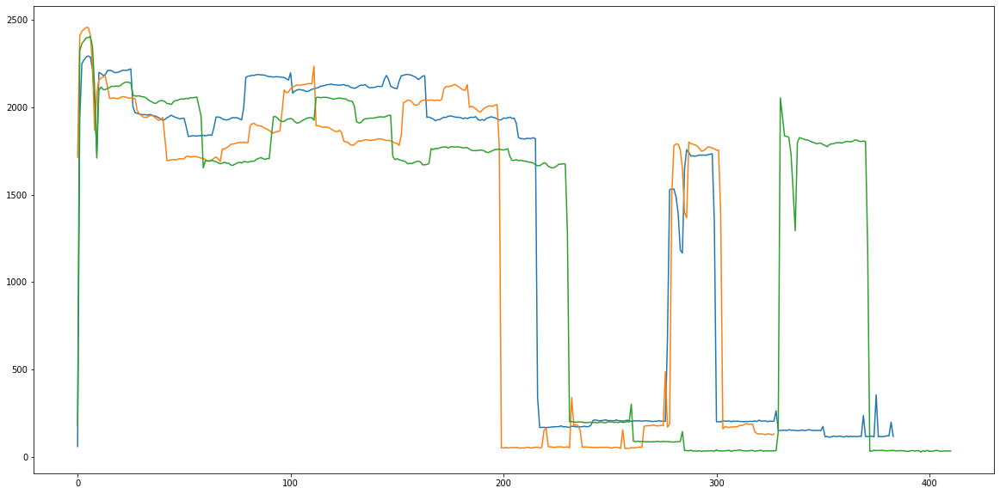

In [95]:
plot_segment_graph(4,'harmonic_I_03')
plot_segment_graph(8,'harmonic_I_03')
plot_segment_graph(17,'harmonic_I_03')

# How would it change your approach if you would know that the switching time between on and off of a device is only a few milliseconds and that then power level would be stable?

<AxesSubplot:title={'center':'harmonic_I_NN'}>

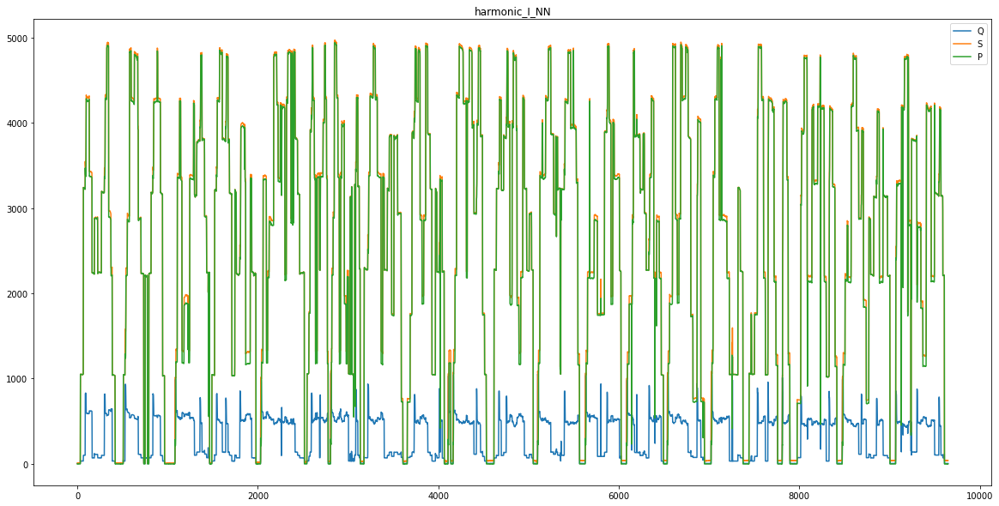

In [96]:
df[['Q','S','P']].plot(title = 'harmonic_I_NN')

# lag difference

In [233]:
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return pd.DataFrame(diff,columns=["derivative"])


def smoothing(dg,window):
    """moving average auxiliary
    :parameters: 
                dg: dataframe
                window: integer
    :returns moving average for dg with size window. """
            
    rolling = dg.rolling(window=window)
    return rolling.mean()

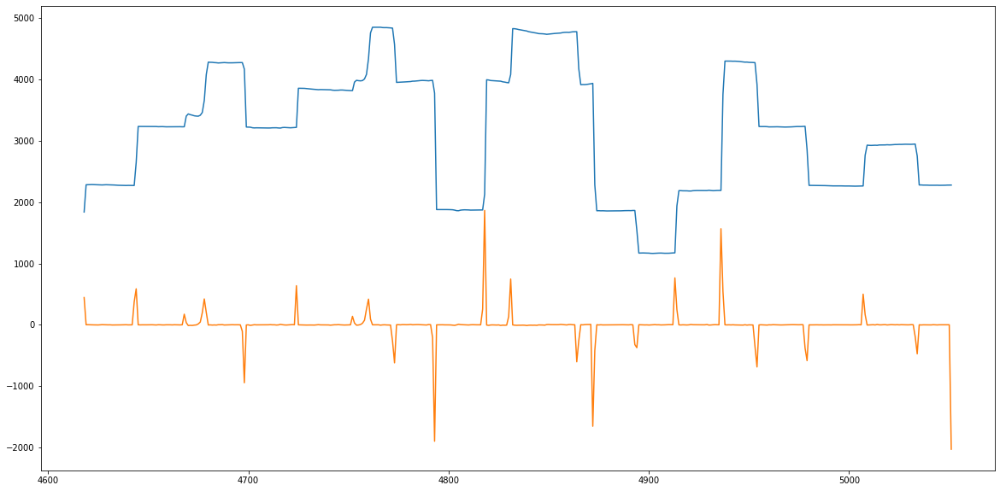

In [212]:
#plt.plot(df['I_rms'][tup_list[13][0]:tup_list[13][1]])
plt.plot(df['P'][tup_list[13][0]:tup_list[13][1]])
plt.plot(difference(df['P'])[tup_list[13][0]:tup_list[13][1]])
#plt.plot(smoothing(df['Q'][tup_list[13][0]:tup_list[13][1]],5))

In [214]:
#diff.index[(diff[0] > 100)].tolist()

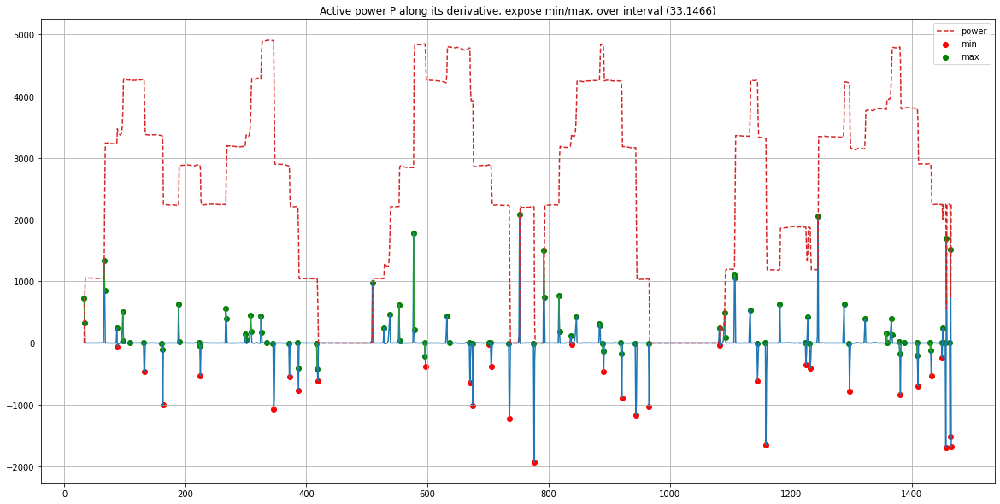

In [240]:
#compute derivative
diff = difference(df['P'])

#interval (a,b):
(a,b) = tup_list[0][0]-1,tup_list[4][1]

#min/max
diff['min'] = diff.loc[(diff["derivative"].shift(1)-10 > diff["derivative"]) & (diff["derivative"].shift(-1)-10 > diff["derivative"])]
diff['max'] = diff.loc[(diff["derivative"].shift(-1) < diff["derivative"]-10)]["derivative"]

# Plot results
plt.scatter(diff[a:b].index, diff['min'][a:b], c='r',label='min')
plt.scatter(diff[a:b].index, diff['max'][a:b], c='g',label='max')
plt.plot(diff[a:b])
plt.plot(df['P'][a:b],'--',label='power')
plt.grid(True)
plt.legend()
plt.title("Active power P along its derivative, expose min/max, over interval ({0},{1})".format(a,b))
plt.show()

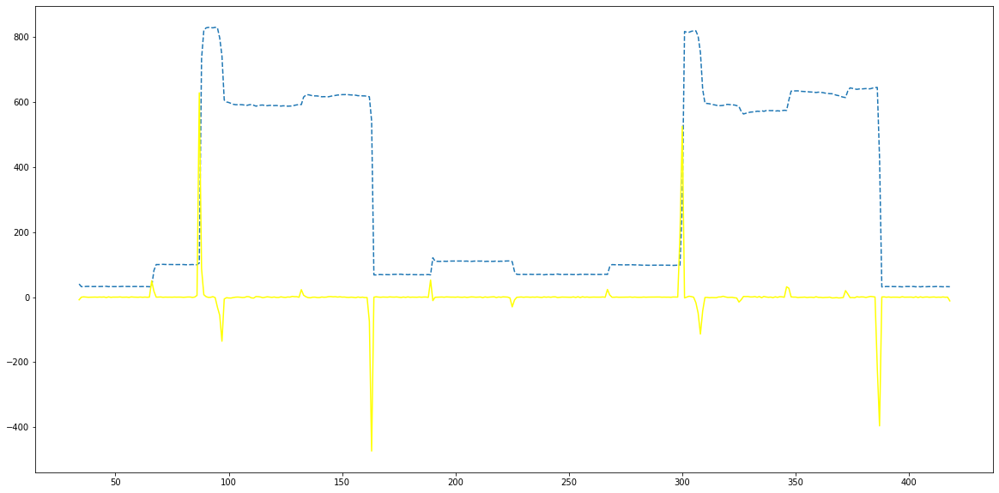

In [202]:
plt.plot(df['Q'][tup_list[0][0]:tup_list[0][1]],"--")
dif = difference(df['Q'])[tup_list[0][0]:tup_list[0][1]]
plt.plot(smoothing(dif,1),c='yellow')

In [136]:
def smoothing(dg,window):
    """moving average auxillary
    :parameters: 
                dg: dataframe
                window: integer
    :returns moving average for dg with size window. """
            "
    rolling = dg.rolling(window=window)
    return rolling.mean()